## 03 - Evaluate HPCS-derived traced cells
Evaluate data from traced and non-traced cohorts specifically focusing on Slc4a11 to evaluate HPCS-derived cells

In [60]:
import numpy as np
import pandas as pd
import scanpy as sc
from joblib import dump, load

import math
import matplotlib
from matplotlib import pyplot as plt
import scipy

from pathlib import Path
import anndata

In [2]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Arial"
#plt.rcParams['figure.figsize'] = (3,4)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

In [4]:
Path("./figures").mkdir(parents=True, exist_ok=True) # generate figures here
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

## Define scoring Functions

In [5]:
# Score Cluster 5 cells
import csv
clusters = {}
clusterkeys = []
HPCS = False

def resetClusters(hpcs = 'cell2020'):
    clusters = {}
    clusterkeys = []
    HPCS = False
    try:
        if hpcs == 'cell2020':         
            with open('../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                for row in csvreader:
                    clusters[row[0]] = [x for x in row[1:] if x != '']
            for i in range(1,13):
                #if i == 9: continue
                clusterkeys.append('Cluster %i' % i)
            HPCS = 'Cluster 5'
        else:
            raise ValueError
    except ValueError:
        print("%s is an invalid choice" % hpcs)
        raise
    return (clusters, clusterkeys, HPCS)

(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [6]:
(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [7]:
def scoreAndPlot(ad, excludeList = None, groupby="Classification",rotation=90,numgenes=25,ctlgenes=25):
    #cmap = 'Reds' #colormap
    cmap = 'jet' #colormap
    if excludeList == None:
        for i in clusterkeys:
            if (numgenes > ctlgenes):
                ctlgenes = numgenes
            sc.tl.score_genes(ad, clusters[i][0:numgenes],score_name="%s" % i, ctrl_size=ctlgenes)
  
        sc.pl.umap(ad, color=clusterkeys, color_map=cmap)
        sc.pl.dotplot(ad, clusterkeys, groupby=groupby, swap_axes=True)

In [8]:
from scipy.stats import ranksums

def HPCSViolinPlot(ad, cluster='0', groupby='leiden', score='Cluster5', save=None, singleGene=False):
    ad.obs['Cl5'] = 'not HPCS'
    ad.obs.loc[ad.obs[groupby].isin([cluster]), 'Cl5'] = 'HPCS'

    if singleGene:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray(),ad[~ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray())[1]
    else:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])].obs[score],ad[ad.obs['Cl5'].isin(['not HPCS'])].obs[score])[1]
    sc.pl.violin(ad, score, groupby='Cl5', xlabel = 'p = ' + str(pvalue), save=save)

## Load only Slc4a11 traced cells

In [9]:
adata = anndata.read_h5ad('write/combined_data.h5ad')

In [10]:
adata.obs[['batch','Group']].value_counts(sort=False)

batch             Group             
traced            6wk_3d                  575
                  8wk                     742
                  12wk_3d                 877
                  14wk                    991
depletion         Saline                10763
untraced_14wk     KPT                    1865
Hopx-MACD         Hopx_GFP+mScarlet+     5661
                  Hopx_GFP+mScarlet-     4847
Hopx-MACD_traced  Hopx_12wk3d            1097
                  Hopx_12wk14d            911
Name: count, dtype: int64

In [11]:
alladata = adata.copy()
adata = adata[adata.obs.batch.isin(['traced']),:].copy()

## Explore Data

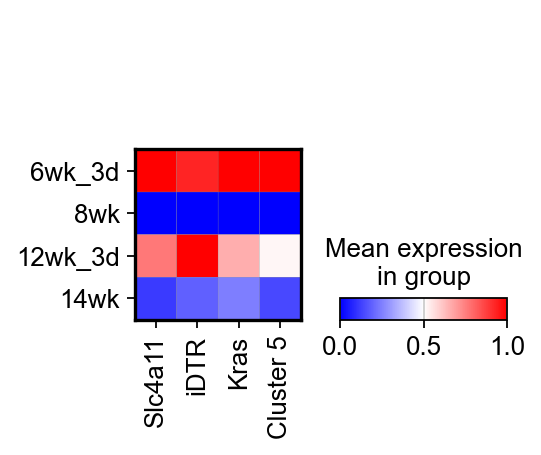

In [12]:
sc.pl.matrixplot(adata,['Slc4a11','iDTR','Kras','Cluster 5'],'Group',cmap='bwr', standard_scale='var')

## Examine Groupings

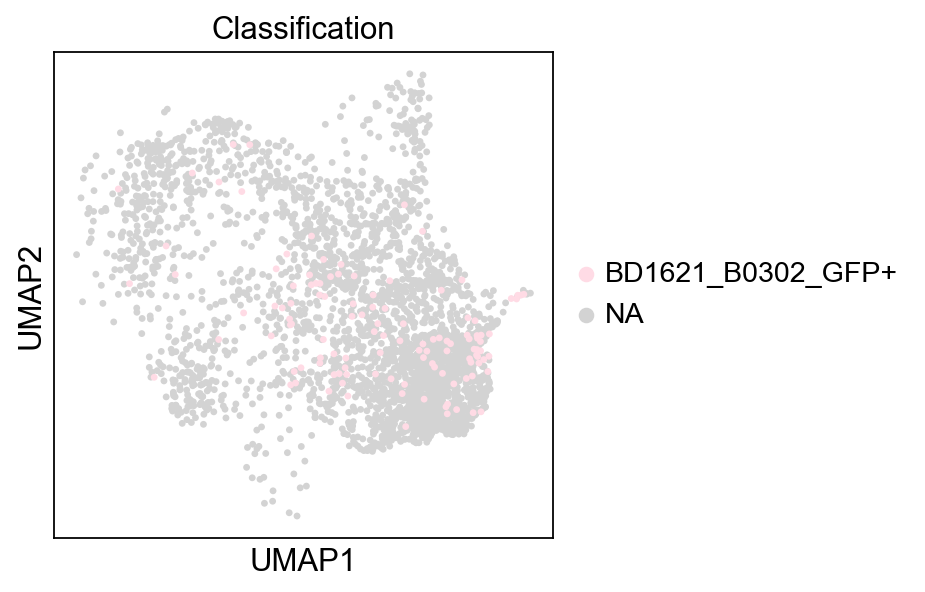

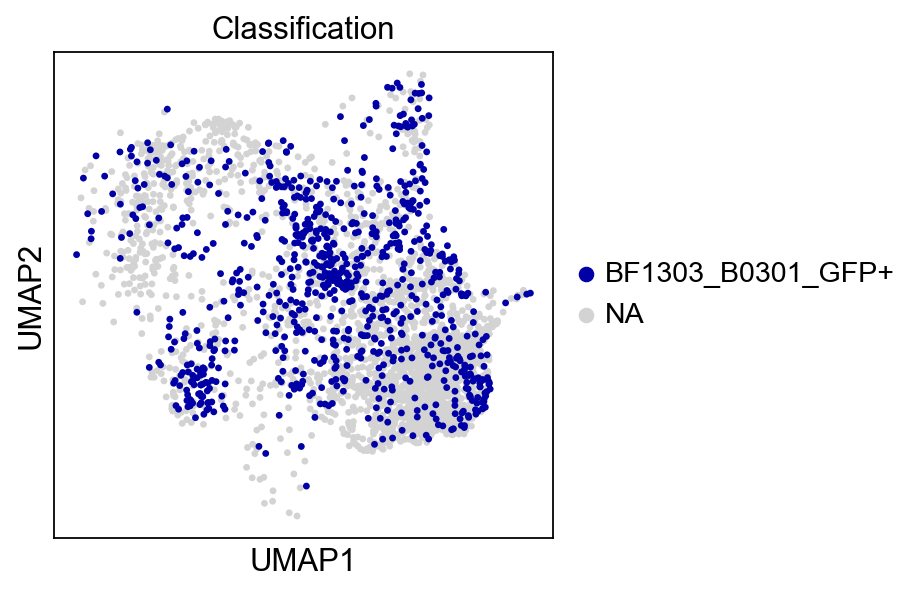

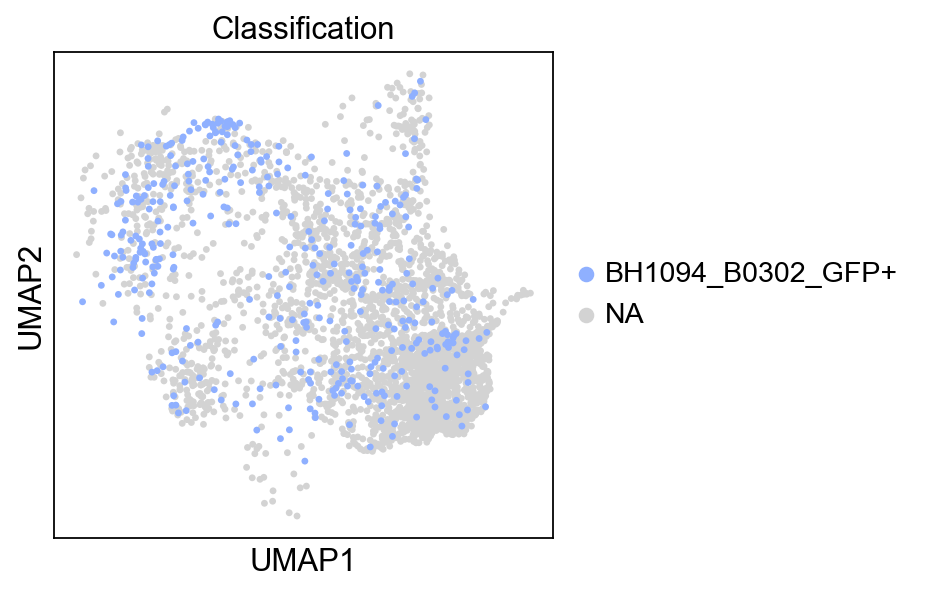

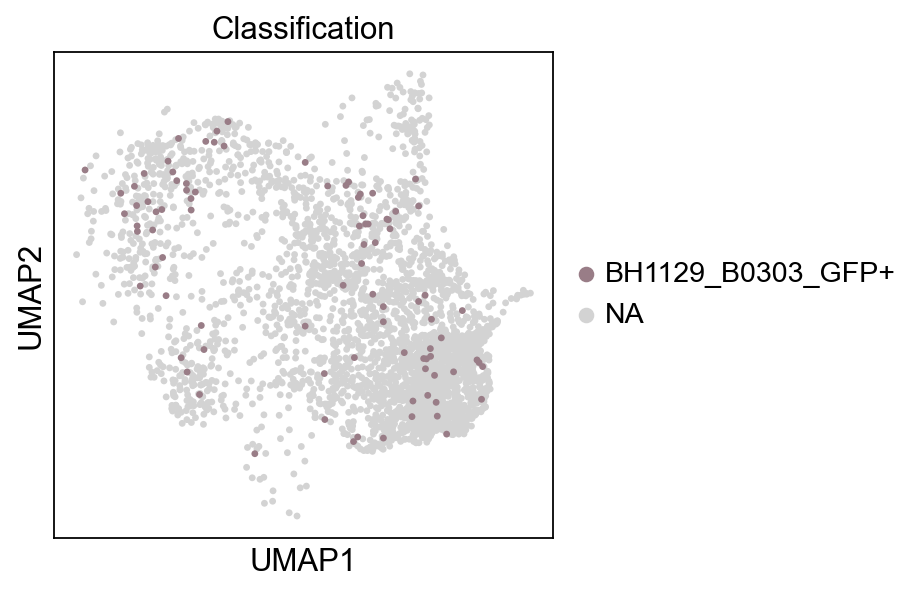

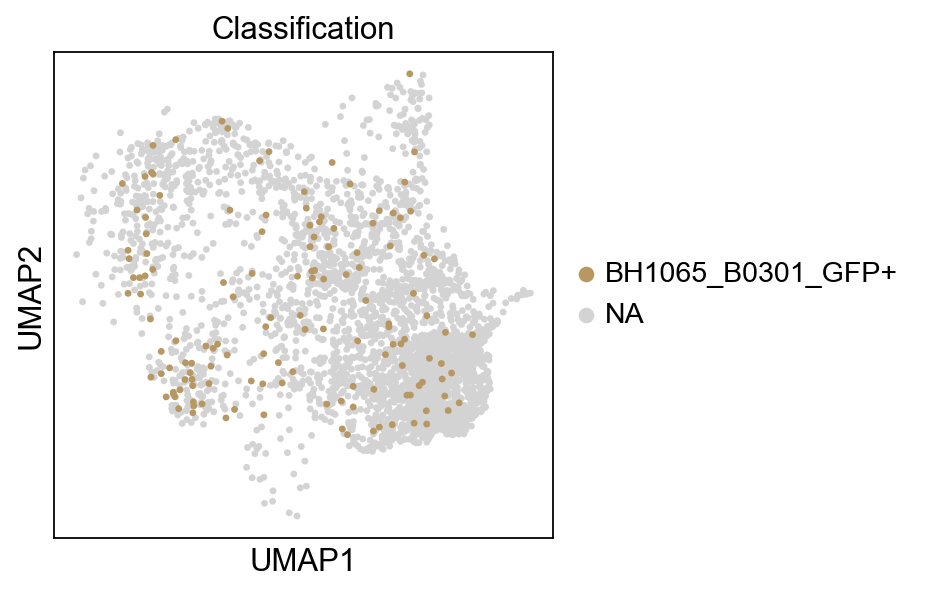

...

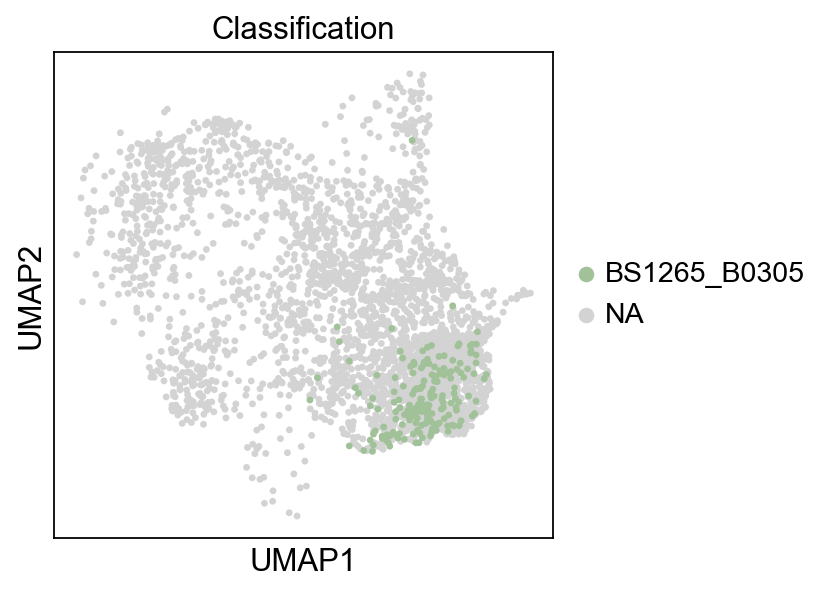

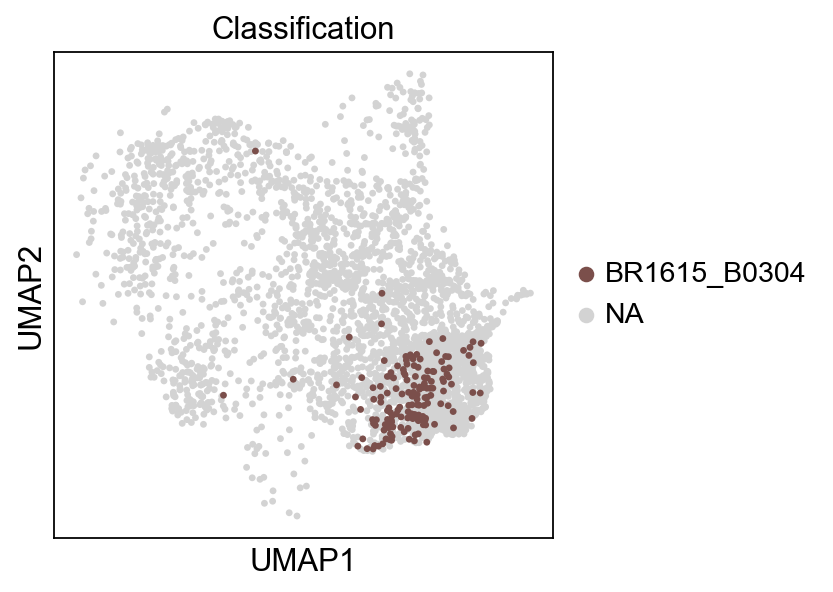

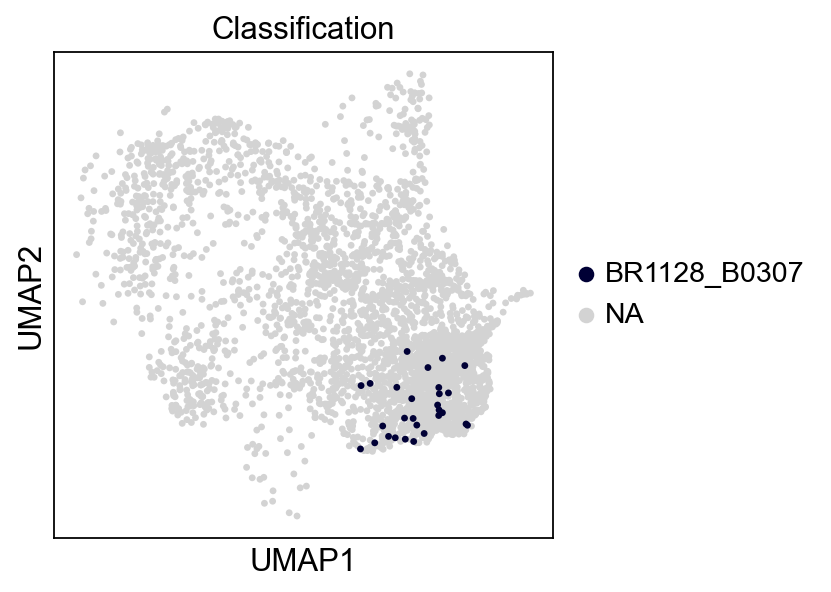

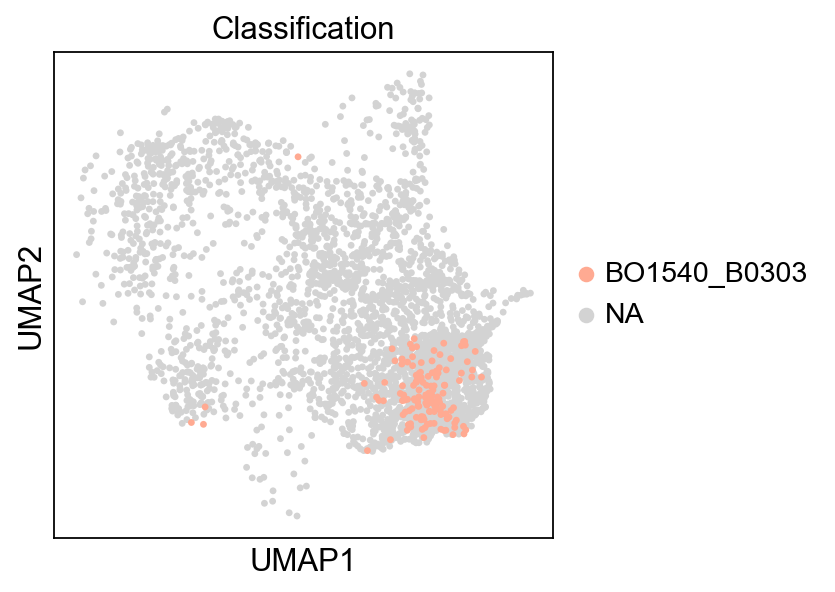

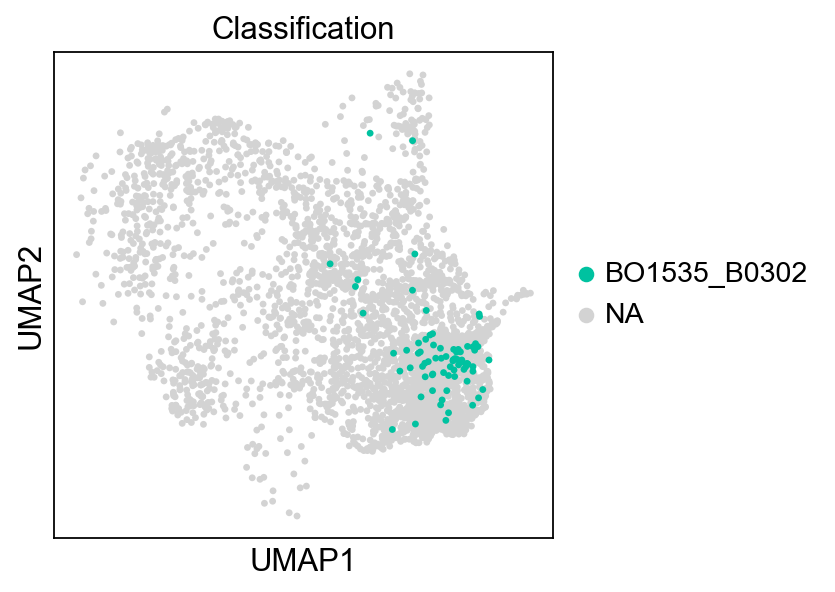

In [13]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [14]:
sc.tl.embedding_density(adata,basis='umap', groupby='Group')

computing density on 'umap'
--> added
    'umap_density_Group', densities (adata.obs)
    'umap_density_Group_params', parameter (adata.uns)


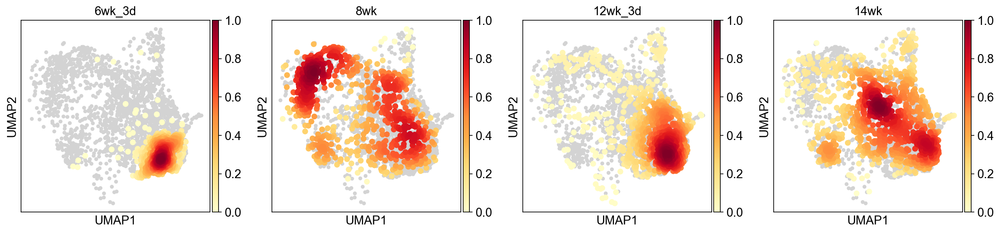

In [15]:
sc.pl.embedding_density(adata,basis='umap',key='umap_density_Group', )

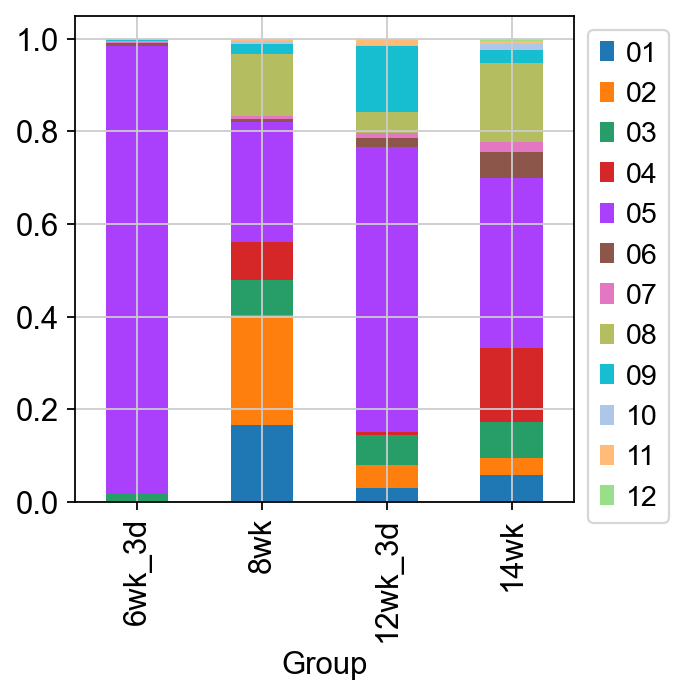

In [16]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12'],adata.obs['Group'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

In [17]:
adata.obs[['Group','Classification']].value_counts(sort=False)

Group    Classification   
6wk_3d   BO1535_B0302          75
         BO1540_B0303         142
         BR1128_B0307          28
         BR1615_B0304         156
         BS1265_B0305         174
8wk      BH1065_B0301_GFP+    138
         BH1094_B0302_GFP+    376
         BH1129_B0303_GFP+     90
         BH1290_B0304_GFP+    138
12wk_3d  BL1121_B0304          57
         BL1124_B0305          67
         BL1233_B0306          58
         BL1237_B0302         239
         BL1606_B0303         354
         BL1646_B0301         102
14wk     BD1621_B0302_GFP+    119
         BF1303_B0301_GFP+    811
         BH1066_GFP+           61
Name: count, dtype: int64

In [18]:
adata.uns['cell type_colors'] = ['#1f77b4',
 '#279e68',
 '#ff7f0e',
 '#aa40fc',
 '#d62728',
 '#e377c2',
 '#8c564b',
 'gray']

In [19]:
adata.obs['cell type'].value_counts(sort=False)

cell type
AT1-like                 250
AT2-like                 534
EMT                       13
Embryonic liver-like     211
HPCS                    1664
Highly proliferative      84
Lung endoderm-like       422
Ribosome                   7
Name: count, dtype: int64

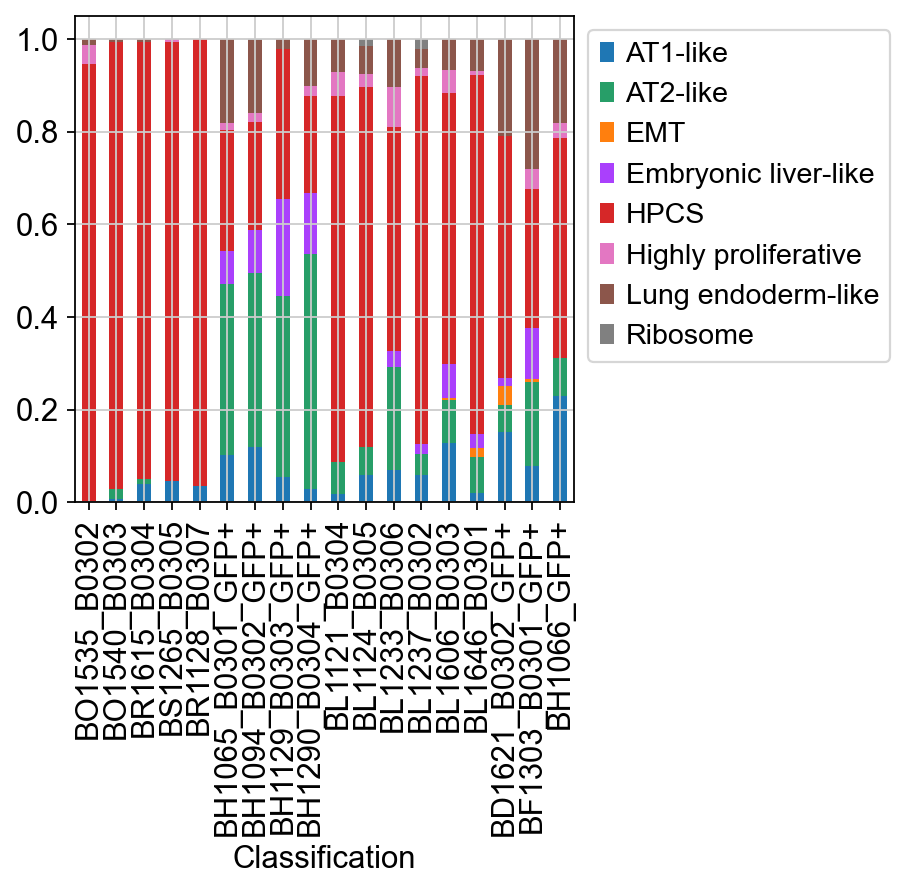

In [20]:
ordered = ['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 'BS1265_B0305','BR1128_B0307', # 6wk 3d
           'BH1065_B0301_GFP+','BH1094_B0302_GFP+','BH1129_B0303_GFP+','BH1290_B0304_GFP+', # 6wk 14d
           'BL1121_B0304','BL1124_B0305','BL1233_B0306','BL1237_B0302','BL1606_B0303','BL1646_B0301', #12wk 3d
           'BD1621_B0302_GFP+','BF1303_B0301_GFP+','BH1066_GFP+'] # 12wk 14d
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Classification'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True, color=adata.uns['cell type_colors']).legend(bbox_to_anchor=(1,1))

In [21]:
sc.tl.embedding_density(adata,basis='umap', groupby='Classification')

computing density on 'umap'
--> added
    'umap_density_Classification', densities (adata.obs)
    'umap_density_Classification_params', parameter (adata.uns)


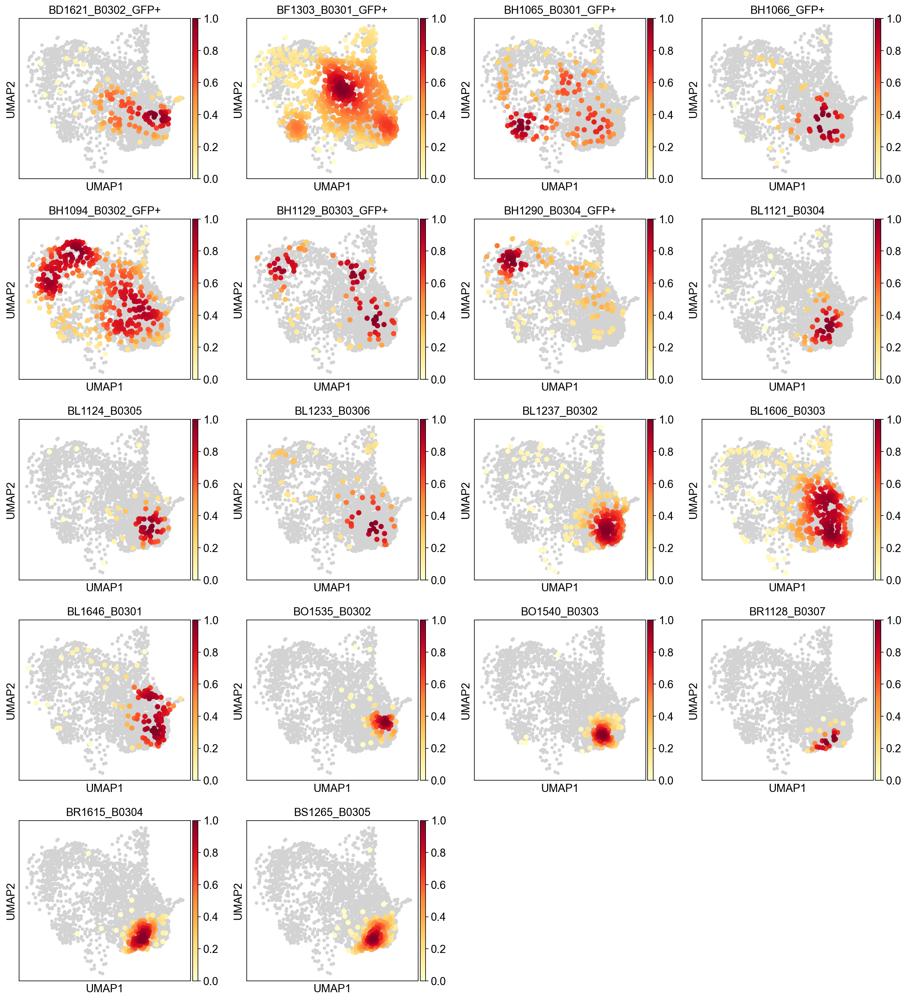

In [22]:
sc.pl.embedding_density(adata,basis='umap',key='umap_density_Classification')

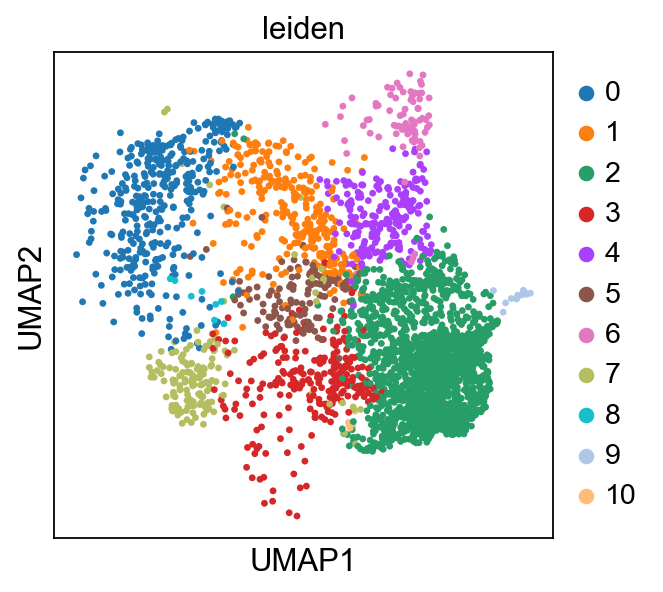

In [23]:
sc.pl.umap(adata, color=['leiden'])

## Compare to Marjanovic et. al. clusters

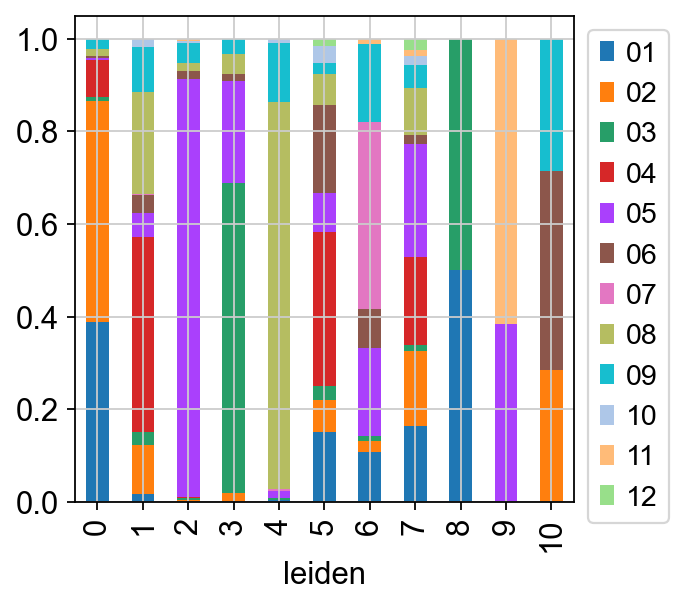

In [24]:
 cell_proportion_df = pd.crosstab(adata.obs['clusterK12'],adata.obs['leiden'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

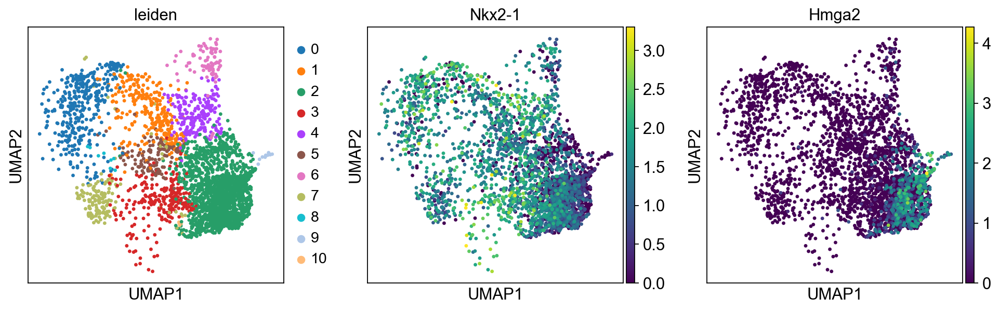

In [25]:
sc.pl.umap(adata, color=['leiden','Nkx2-1','Hmga2'])

## Figures for the paper

### Generate bar graph figures

In [26]:
adata2 = adata[adata.obs.Group.isin(['14wk']),:]

In [27]:
adata2.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata2.obs['cell type']]

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_57726/309636913.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata2.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata2.obs['cell type']]


In [28]:
adata3 = adata[adata.obs.Group.isin(['8wk']),:] # should this be extended to the 6wk_3d

In [29]:
adata3.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata3.obs['cell type']]

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_57726/1242395224.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata3.obs['HPCS_cell'] = [1  if x == 'HPCS' else 0 for x in adata3.obs['cell type']]


#### 14 week timepoints

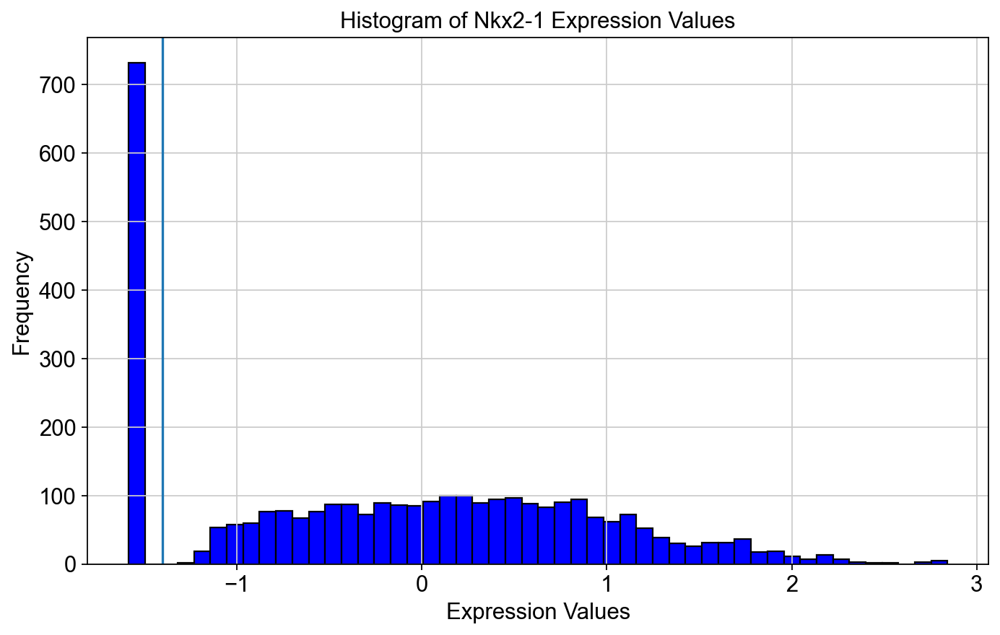

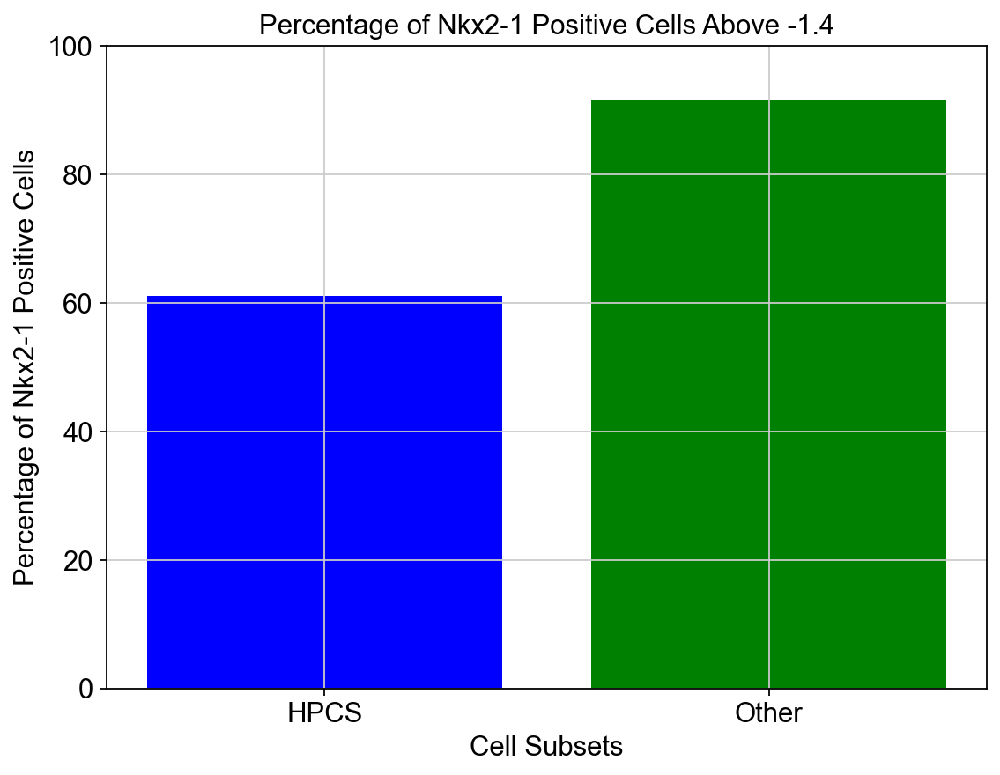

SignificanceResult(statistic=0.14621784205810828, pvalue=2.228434820800672e-29)

In [30]:
gene = 'Nkx2-1'
expression_values = adata[:, gene].X
threshold = -1.4

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

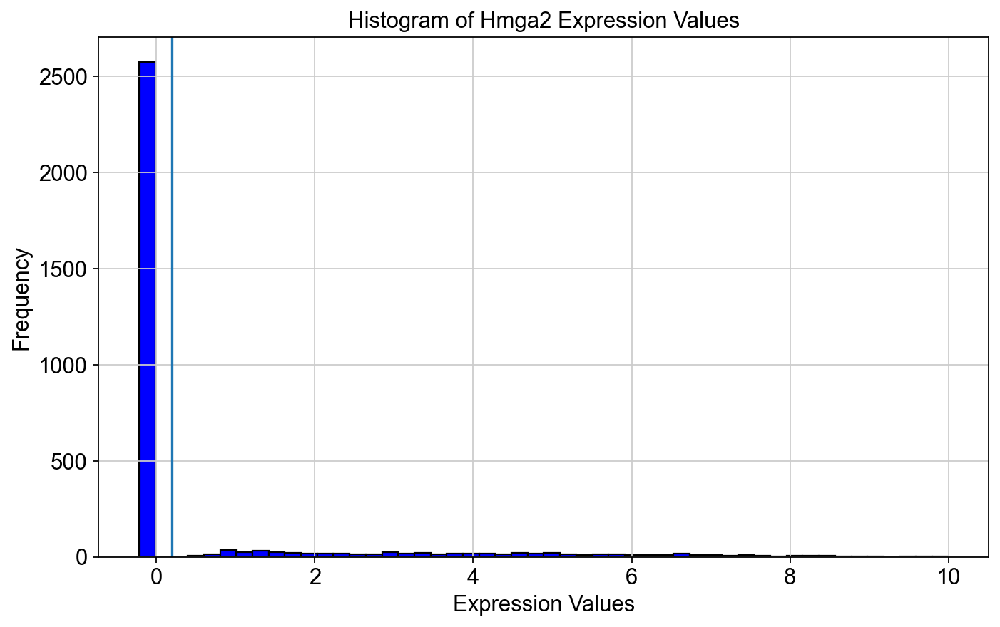

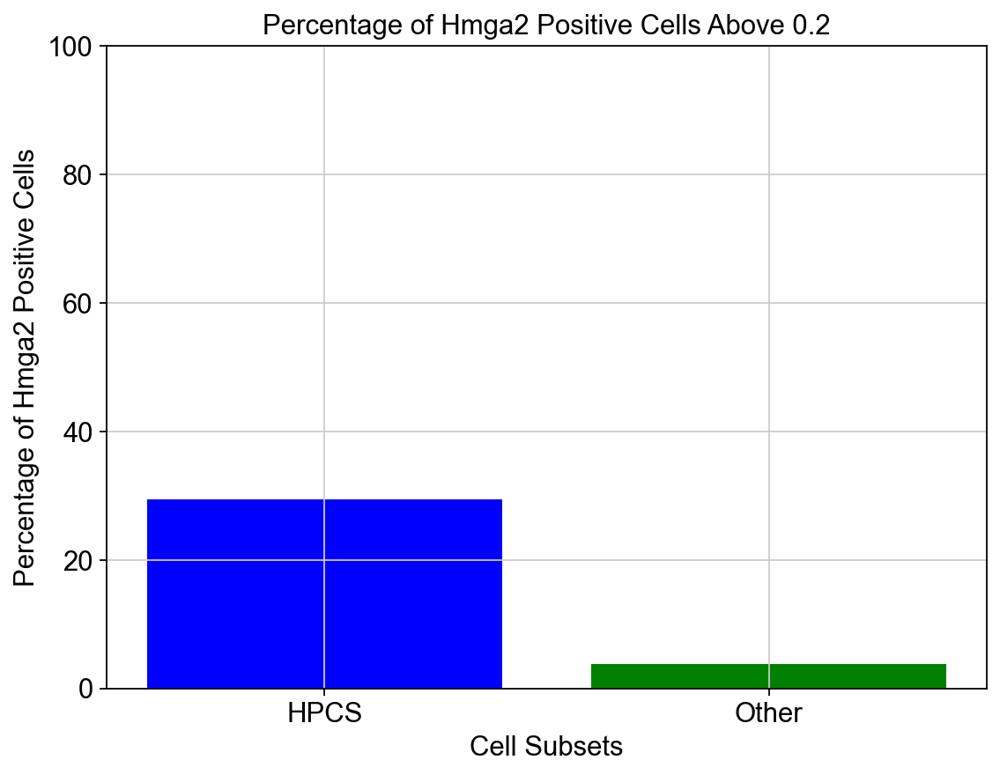

SignificanceResult(statistic=10.497627118644068, pvalue=3.5860155616582404e-29)

In [31]:
gene = 'Hmga2'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

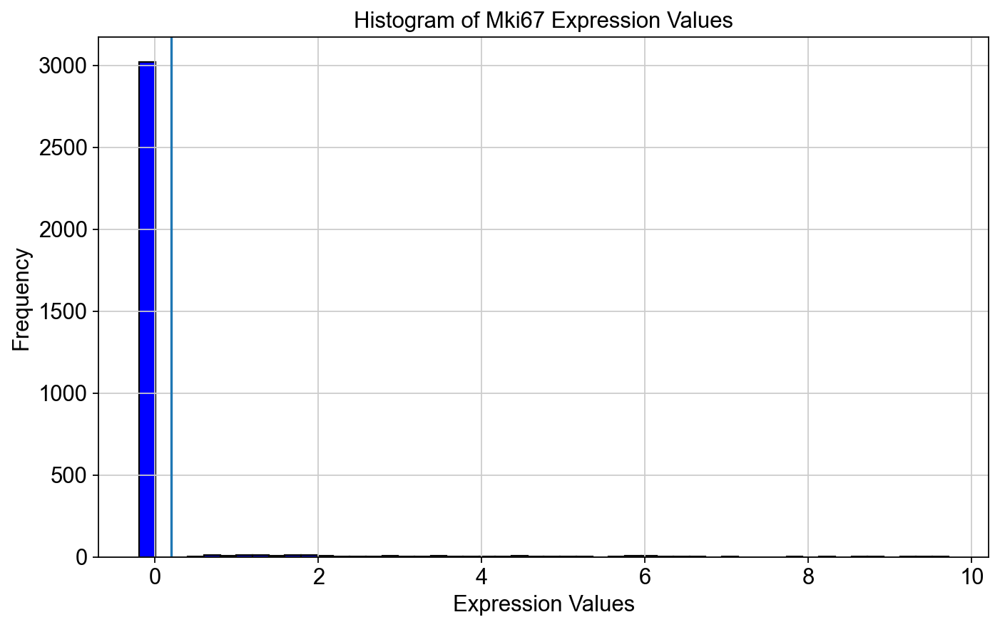

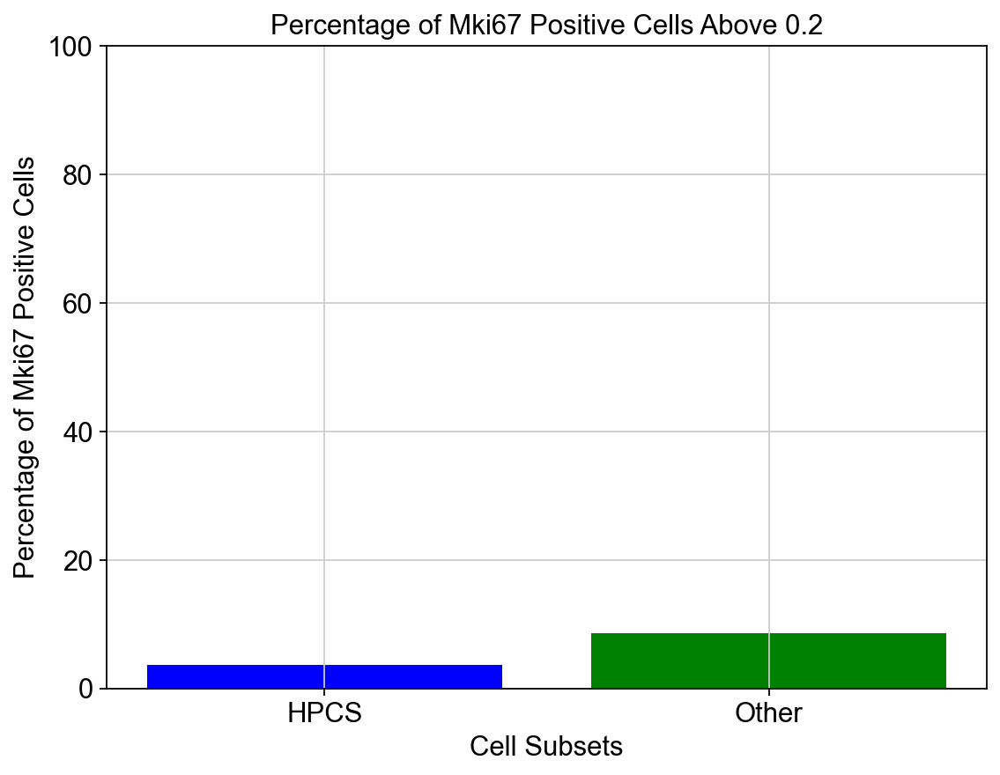

SignificanceResult(statistic=0.3999556344276841, pvalue=0.0032534970191121053)

In [32]:
gene = 'Mki67'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

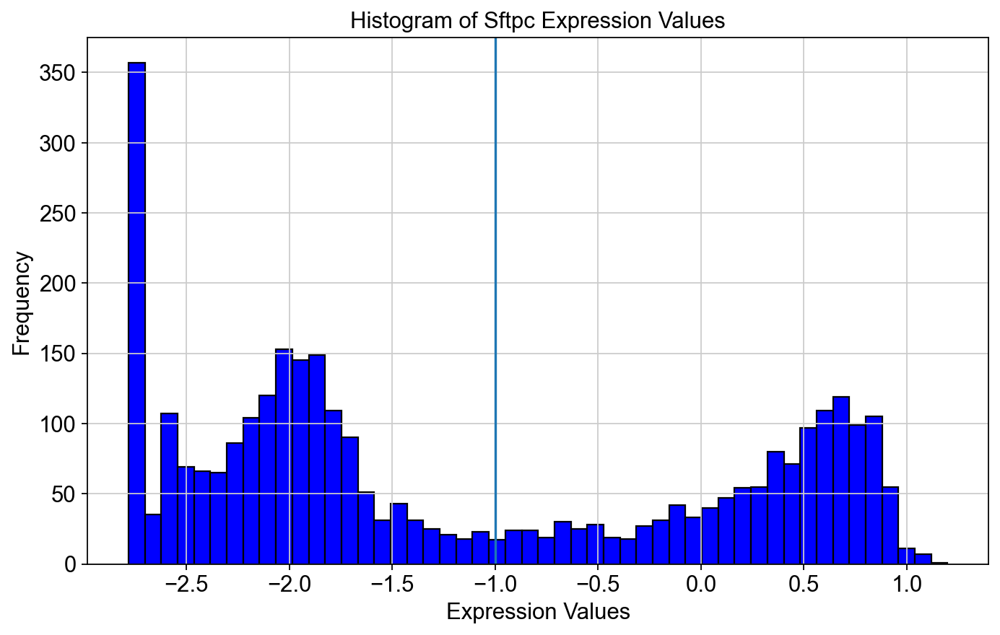

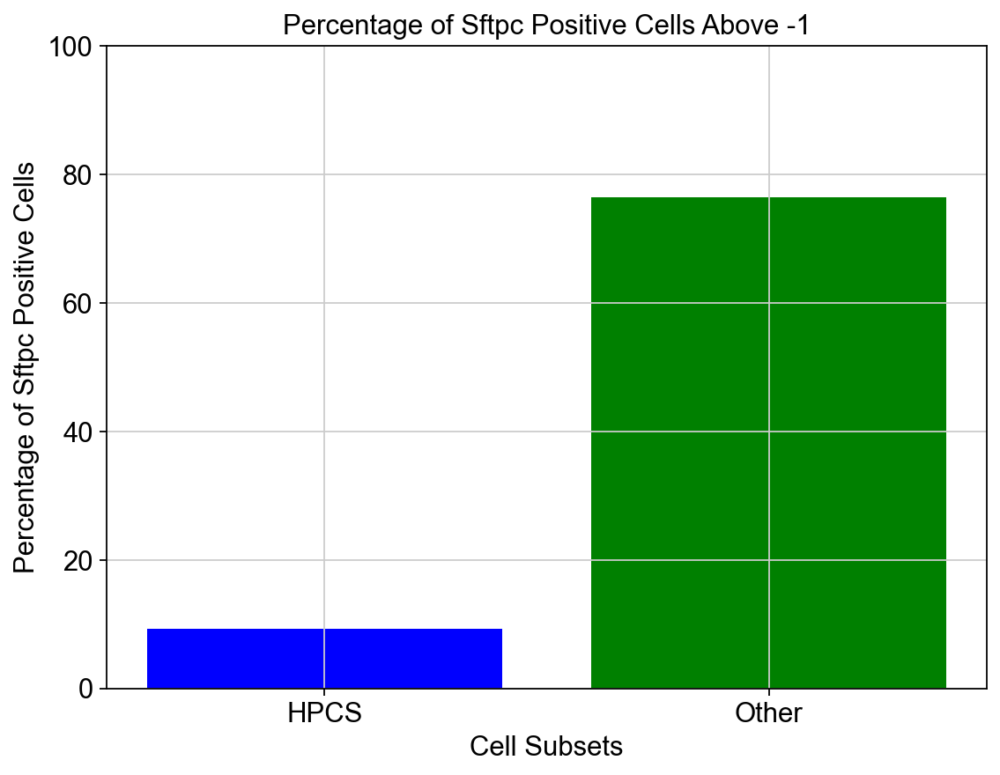

SignificanceResult(statistic=0.03158981236769095, pvalue=5.481487692338201e-98)

In [33]:
gene = 'Sftpc'
expression_values = adata[:, gene].X
threshold = -1

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

# Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

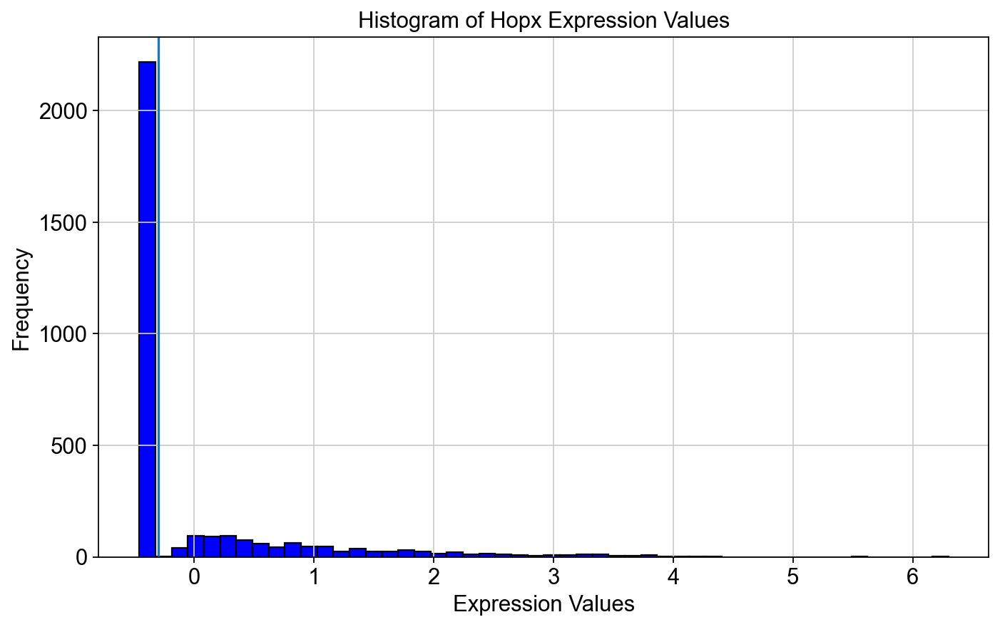

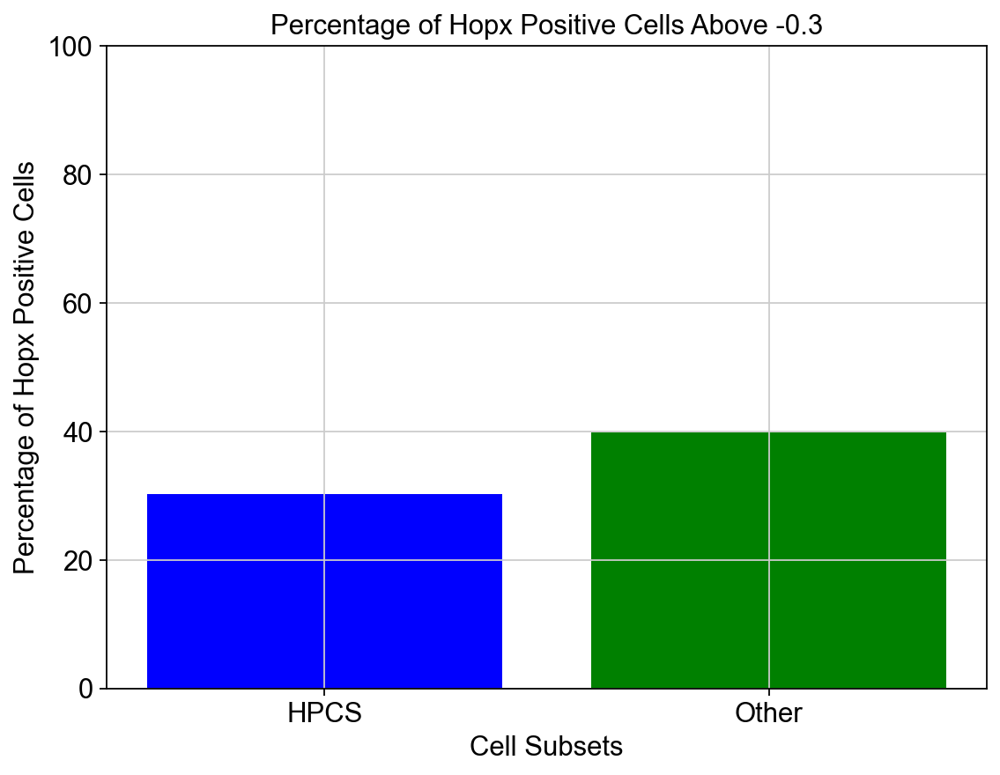

SignificanceResult(statistic=0.6535235723880353, pvalue=0.0033632876105214853)

In [34]:
gene = 'Hopx'
expression_values = adata[:, gene].X
threshold = -0.3

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

#Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

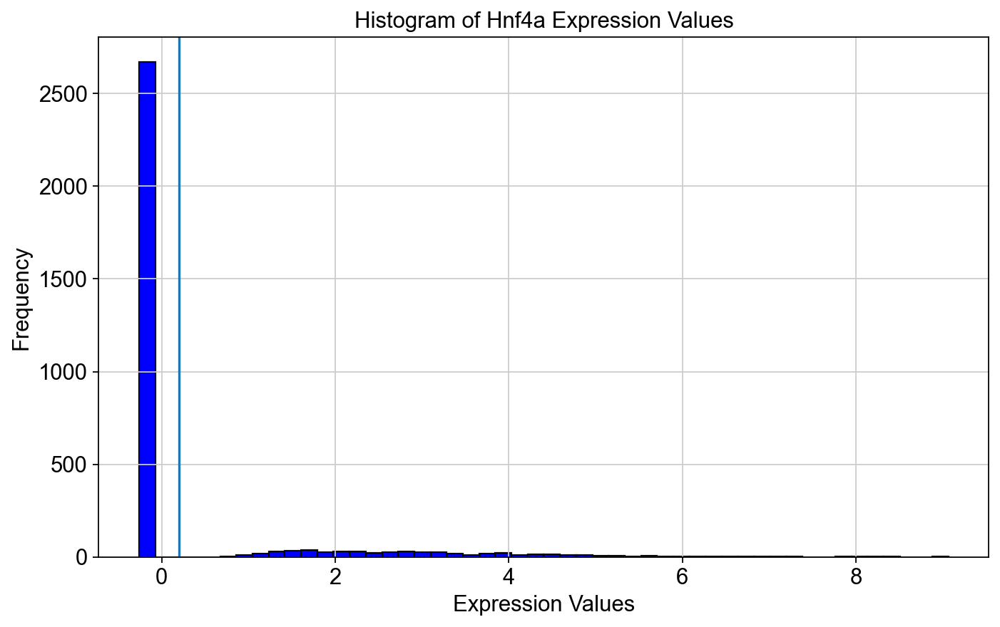

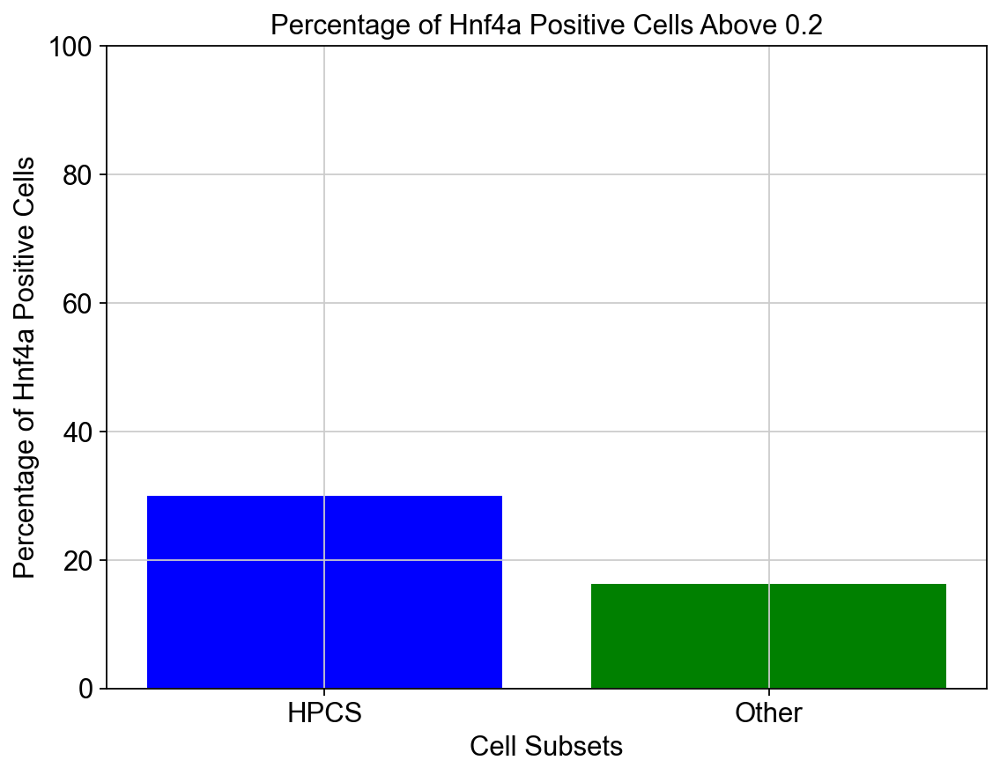

SignificanceResult(statistic=2.196661075165748, pvalue=9.606366488992594e-07)

In [35]:
gene = 'Hnf4a'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata2[adata2.obs['HPCS_cell'] == 1,:]
subset_b = adata2[adata2.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene 'Mki67' for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_14wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

#### 8 week timepoints

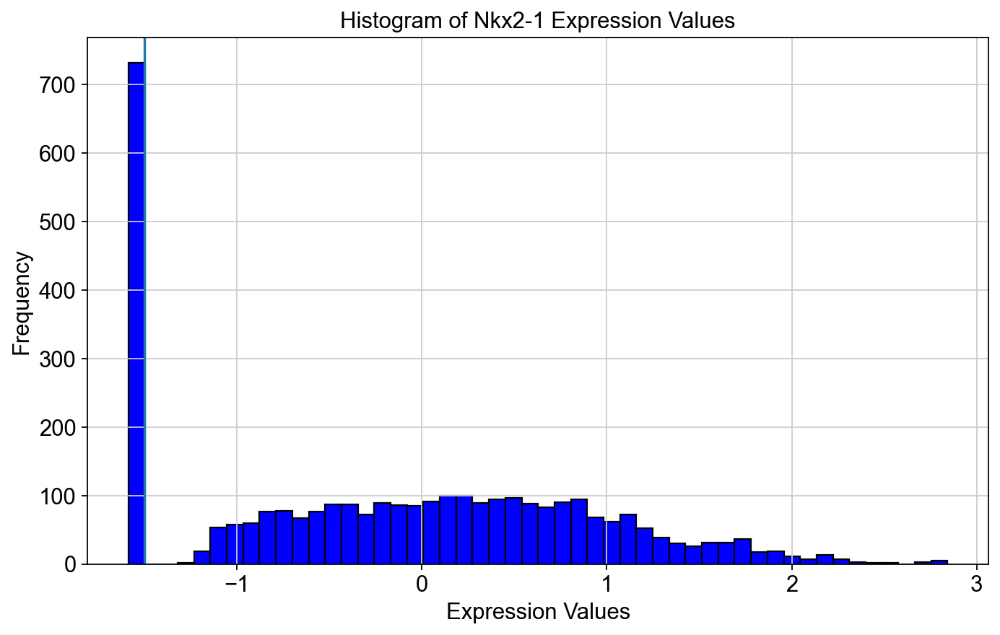

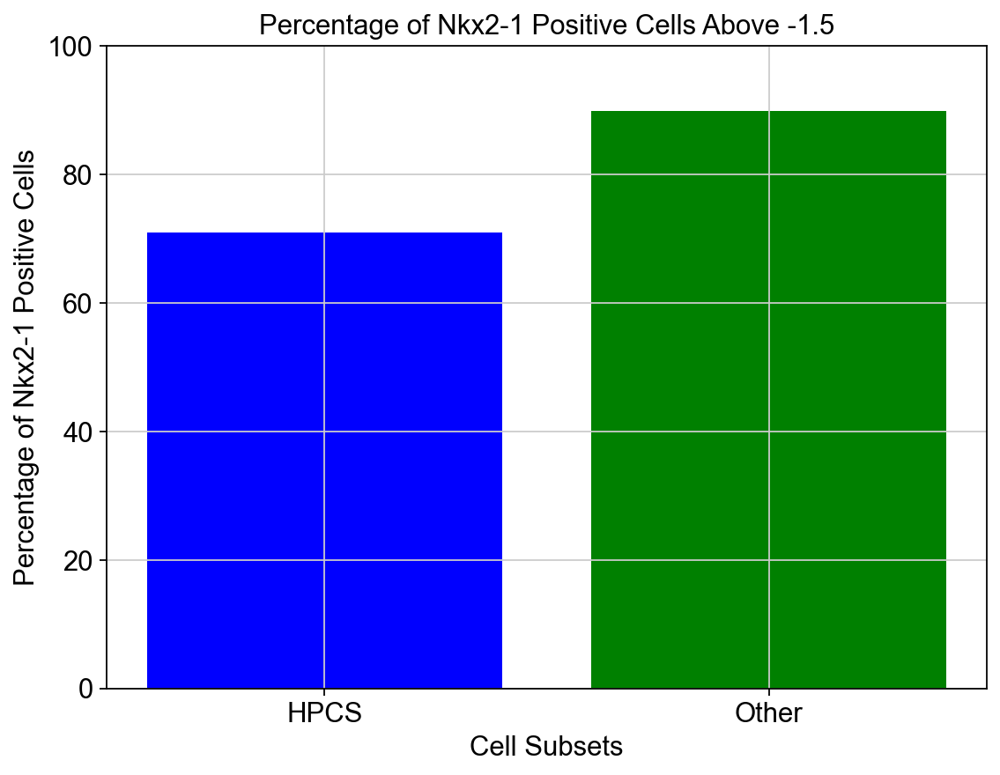

SignificanceResult(statistic=0.27581679732923214, pvalue=5.9732020696079564e-09)

In [36]:
gene = 'Nkx2-1'
expression_values = adata[:, gene].X
threshold = -1.5

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

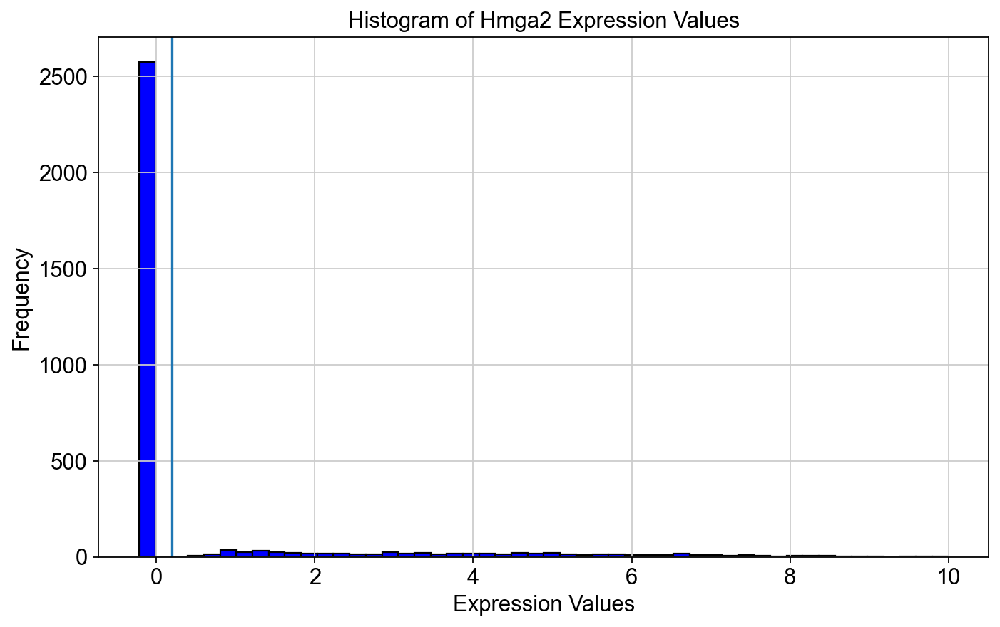

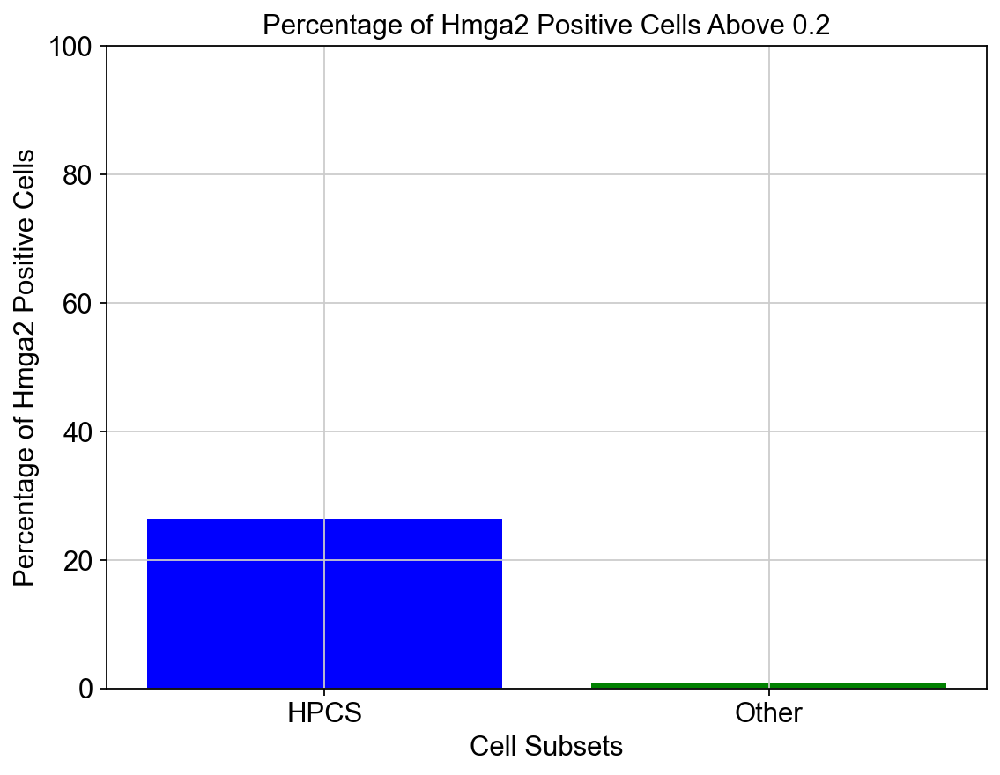

SignificanceResult(statistic=39.76119402985075, pvalue=2.617236796181862e-26)

In [37]:
gene = 'Hmga2'
expression_values = adata[:, gene].X
threshold = .2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

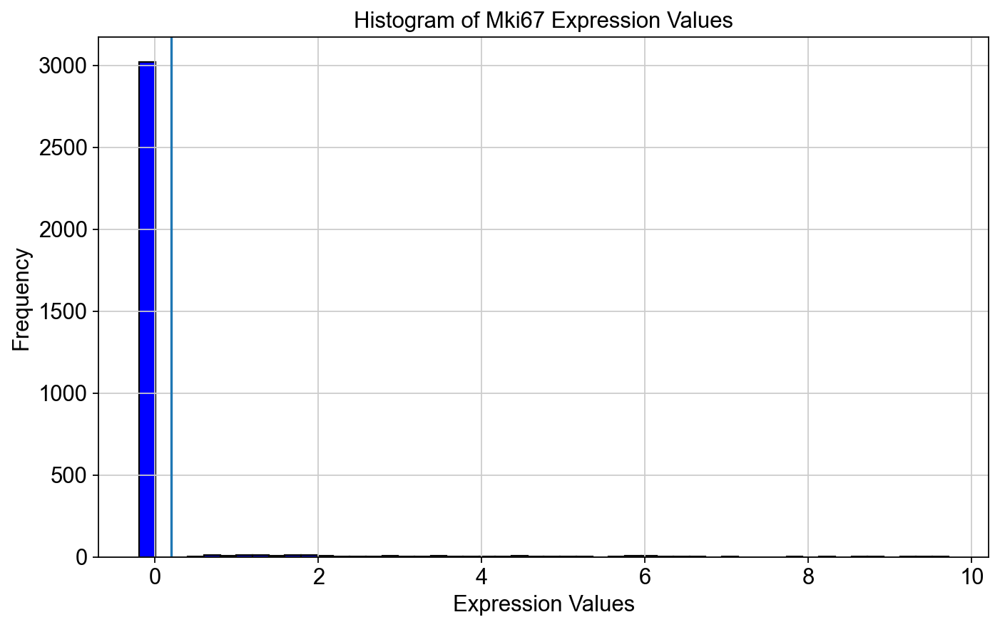

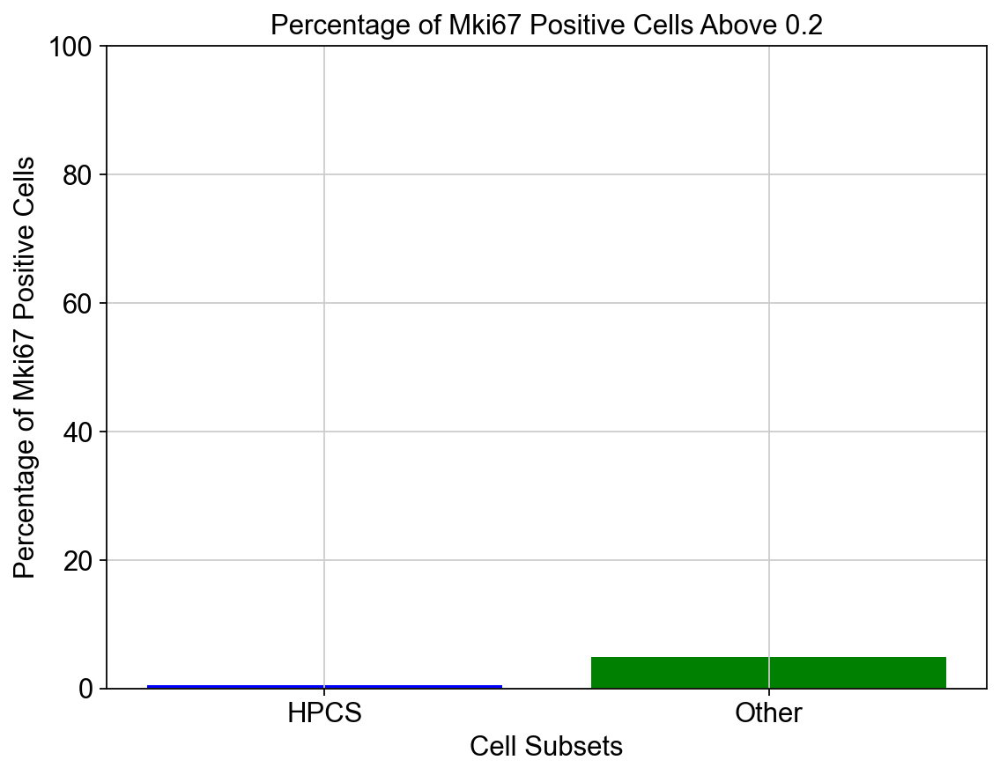

SignificanceResult(statistic=0.10906486597094332, pvalue=0.005978727912928243)

In [38]:
gene = 'Mki67'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

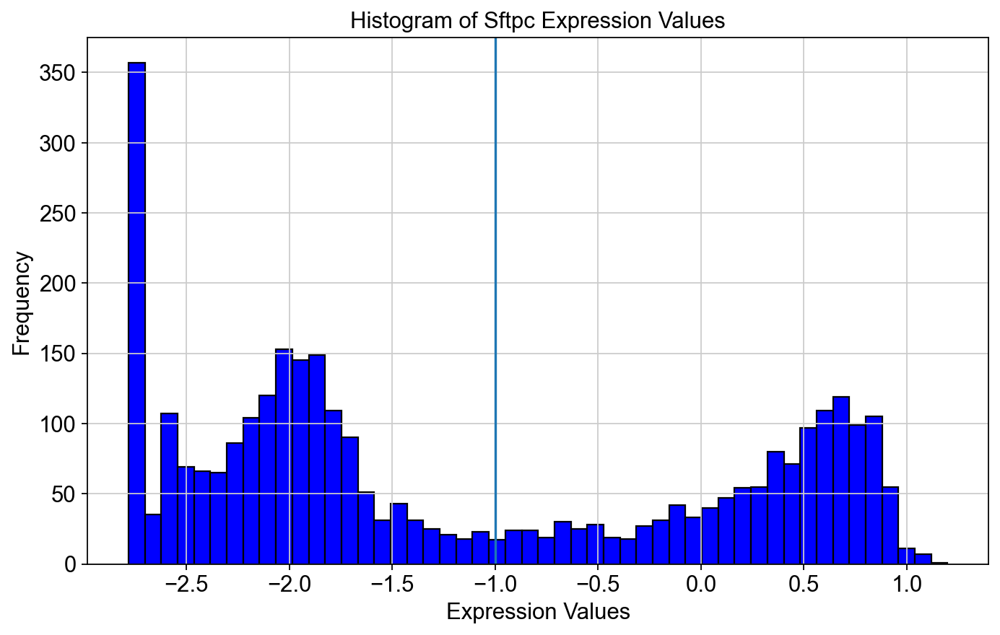

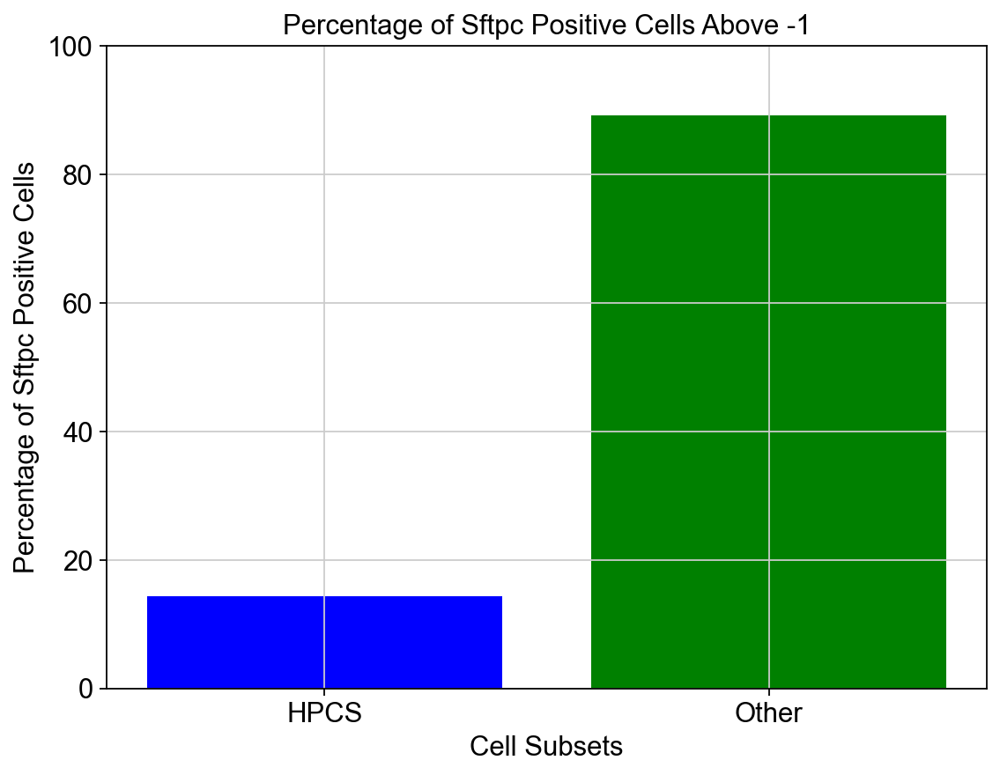

SignificanceResult(statistic=0.020374081496325986, pvalue=3.625322712886161e-80)

In [39]:
gene = 'Sftpc'
expression_values = adata[:, gene].X
threshold = -1

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

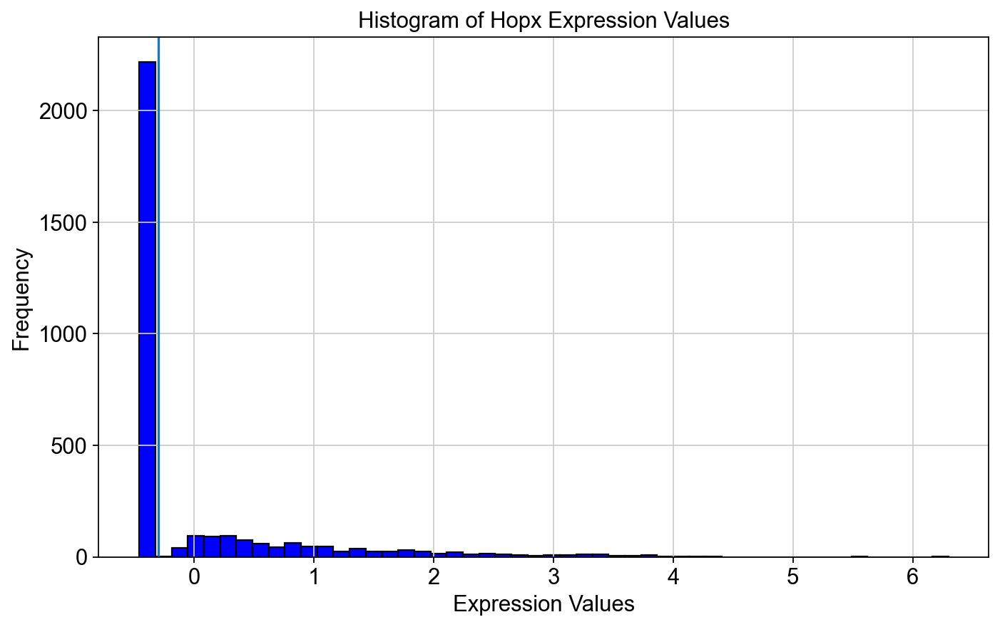

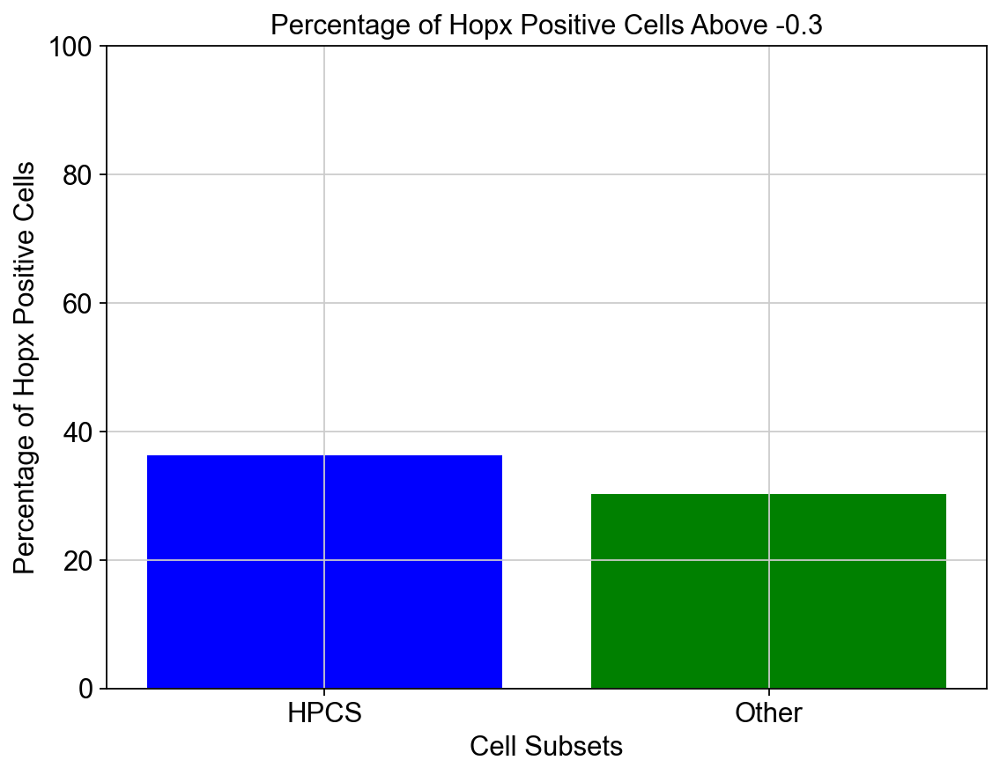

SignificanceResult(statistic=1.3163640073454397, pvalue=0.1421659777814869)

In [40]:
gene = 'Hopx'
expression_values = adata[:, gene].X
threshold = -0.3

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics
from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

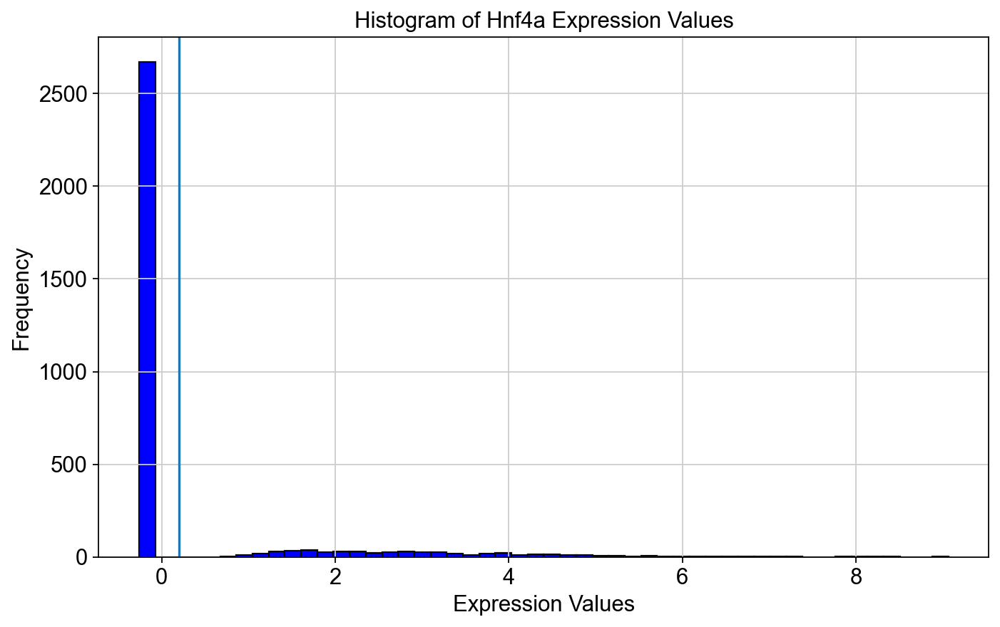

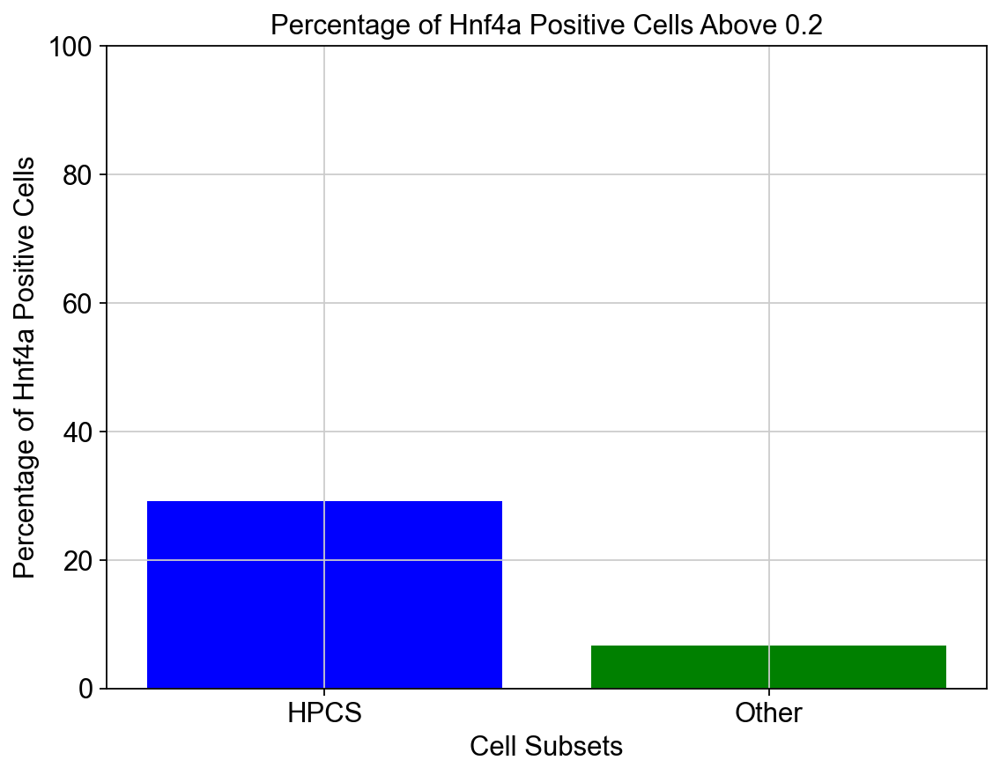

SignificanceResult(statistic=5.80745862141211, pvalue=7.388706561008696e-14)

In [41]:
gene = 'Hnf4a'
expression_values = adata[:, gene].X
threshold = 0.2

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(expression_values, bins=50, color='blue', edgecolor='black')
plt.axvline(x=threshold)
plt.xlabel('Expression Values')
plt.ylabel('Frequency')
plt.title(f'Histogram of {gene} Expression Values')
plt.show()

# Bar Graph

subset_a = adata3[adata3.obs['HPCS_cell'] == 1,:]
subset_b = adata3[adata3.obs['HPCS_cell'] == 0,:]

# Extract the expression values for the gene for each subset
expression_values_a = subset_a[:, gene].X
expression_values_b = subset_b[:, gene].X

# Calculate the percentage of cells with expression values above the threshold
percent_a = (expression_values_a > threshold).sum() / len(expression_values_a) * 100
percent_b = (expression_values_b > threshold).sum() / len(expression_values_b) * 100

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(['HPCS', 'Other'], [percent_a, percent_b], color=['blue', 'green'])
plt.xlabel('Cell Subsets')
plt.ylabel(f'Percentage of {gene} Positive Cells')
plt.title(f'Percentage of {gene} Positive Cells Above {threshold}')
plt.ylim(0, 100)
plt.savefig(f'figures/Ext_Data_Fig8f_{gene}_positive_cells_percentage_8wk.svg')
plt.show()

#Calculate statistics

from scipy.stats import fisher_exact
table = [[(expression_values_a > threshold).sum(), (expression_values_a <= threshold).sum()],
        [(expression_values_b > threshold).sum(), (expression_values_b <= threshold).sum()]]
fisher_exact(table)

### Generate uMAPs

In [42]:
adataold = adata.copy()
adata = alladata[alladata.obs.batch.isin(['traced','Hopx-MACD_traced']),:].copy() # put traced cells into one UMAP

In [43]:
adata.obs['cell type']

AAACCCAGTAGCGTAG-1-14wk-traced                    AT1-like
AAACGAATCAAGTCGT-1-14wk-traced          Lung endoderm-like
AAAGAACAGATGACAT-1-14wk-traced                    AT2-like
AAAGGGCTCACTTGTT-1-14wk-traced                    AT1-like
AAAGGTATCCATAGGT-1-14wk-traced        Embryonic liver-like
                                              ...         
TGTCACTTCAGCAGAG-1-12wk_14d-traced                AT1-like
TGTCATGAGTGCCAGT-1-12wk_14d-traced                AT1-like
TGTCATTCACCTACGT-1-12wk_14d-traced                AT1-like
TGTCCCTGTTAGCATC-1-12wk_14d-traced                AT1-like
TGTGCGCGTCCATCAG-1-12wk_14d-traced    Embryonic liver-like
Name: cell type, Length: 5193, dtype: category
Categories (8, object): ['AT1-like', 'AT2-like', 'EMT', 'Embryonic liver-like', 'HPCS', 'Highly proliferative', 'Lung endoderm-like', 'Ribosome']

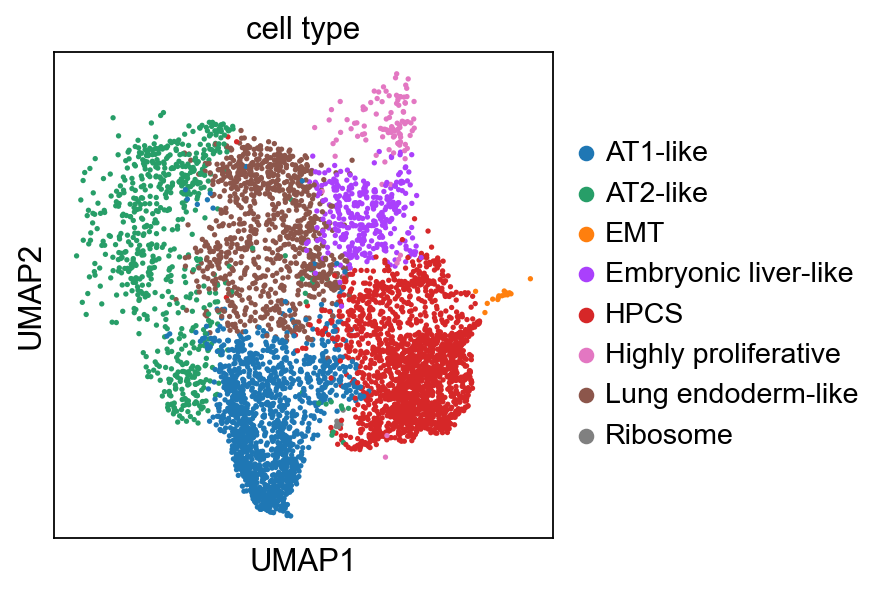

In [44]:
sc.pl.umap(adata,color=['cell type'], save='Ext_Data_Fig8a_cell state umap.svg')
#sc.pl.umap(adata,color=['Slc4a11'], save='Slc4a11 umap.svg', cmap='Reds')
#sc.pl.umap(adata,color=['iDTR'], save='DTR umap.svg', cmap='Reds')
#sc.pl.umap(adata,color=['Cluster 5'], save='Cluster 5 umap.svg', cmap='Reds')

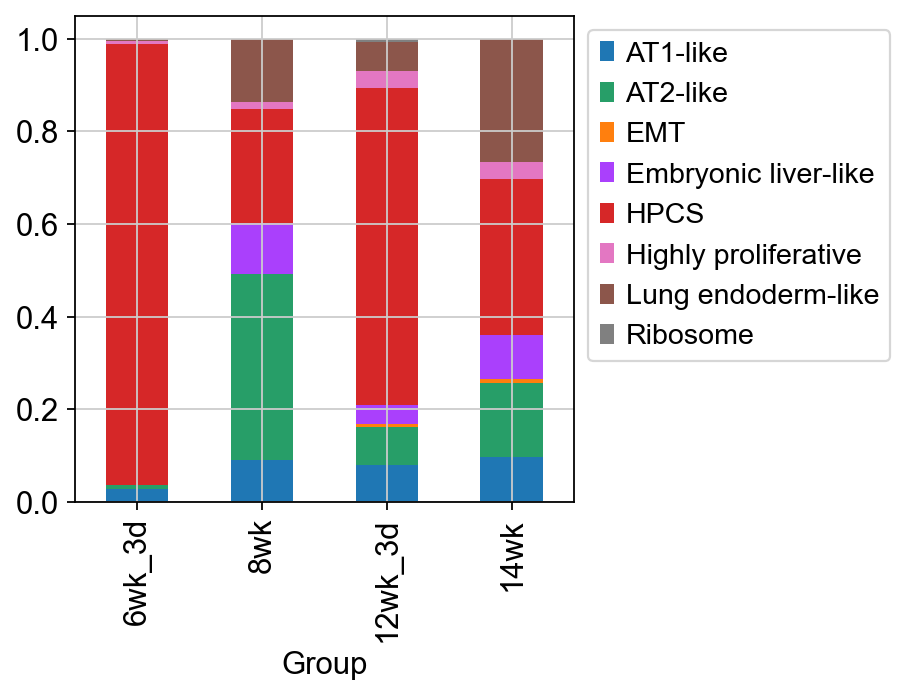

In [45]:
ordered = ['6wk_3d', '8wk','12wk_3d','14wk']
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Group'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True, color=adata.uns["cell type_colors"]).legend(bbox_to_anchor=(1,1))
cell_proportion_df.get_figure().savefig('figures/Fig2e_f_cell state proportions.svg')

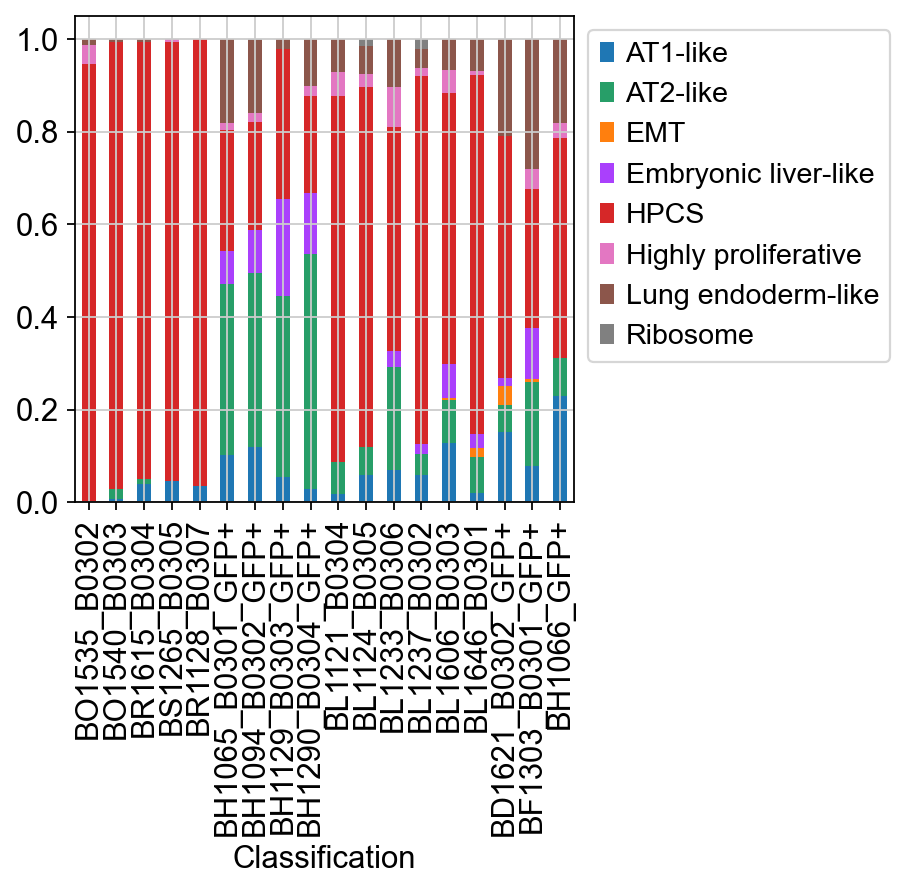

In [46]:
ordered = ['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 'BS1265_B0305','BR1128_B0307', # 6wk 3d
           'BH1065_B0301_GFP+','BH1094_B0302_GFP+','BH1129_B0303_GFP+','BH1290_B0304_GFP+', # 6wk 14d
           'BL1121_B0304','BL1124_B0305','BL1233_B0306','BL1237_B0302','BL1606_B0303','BL1646_B0301', #12wk 3d
           'BD1621_B0302_GFP+','BF1303_B0301_GFP+','BH1066_GFP+'] # 12wk 14d
cell_proportion_df = pd.crosstab(adata.obs['cell type'],adata.obs['Classification'], normalize='columns')[ordered].T.plot(kind='bar', stacked=True,color=adata.uns["cell type_colors"]).legend(bbox_to_anchor=(1,1))
cell_proportion_df.get_figure().savefig('figures/Ext_Data_Fig8b_cellmapbyID2.svg')

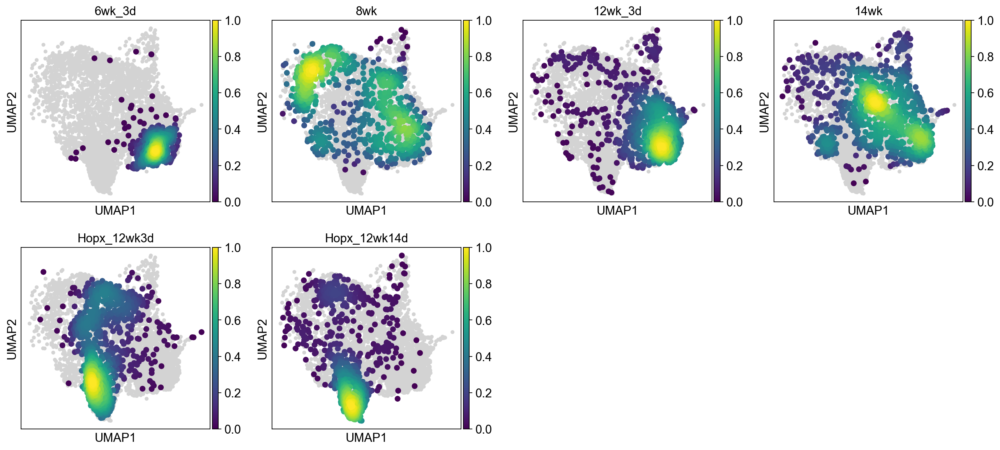

In [47]:
sc.pl.embedding_density(adata, basis='umap', key='umap_density_Group',save='Fig2_e_f_g_Week.svg',color_map='viridis',)

In [48]:
adata.obs.Group.value_counts()

Group
Hopx_12wk3d     1097
14wk             991
Hopx_12wk14d     911
12wk_3d          877
8wk              742
6wk_3d           575
Name: count, dtype: int64

In [49]:
adata_t = adata[adata.obs.Group.isin(['6wk_3d','8wk']),:].copy()

In [50]:
# Get current 'cell type' categories in the subset (in correct order)
present_categories = adata_t.obs['cell type'].cat.categories

# Get the original colors and categories
all_categories = adata.obs['cell type'].cat.categories
all_colors = adata.uns['cell type_colors']

# Map original categories to their colors
category_color_map = dict(zip(all_categories, all_colors))

# Now only keep colors for the present categories
subset_colors = [category_color_map[cat] for cat in present_categories]

# Assign them to the subset AnnData
adata_t.uns['cell type_colors'] = subset_colors

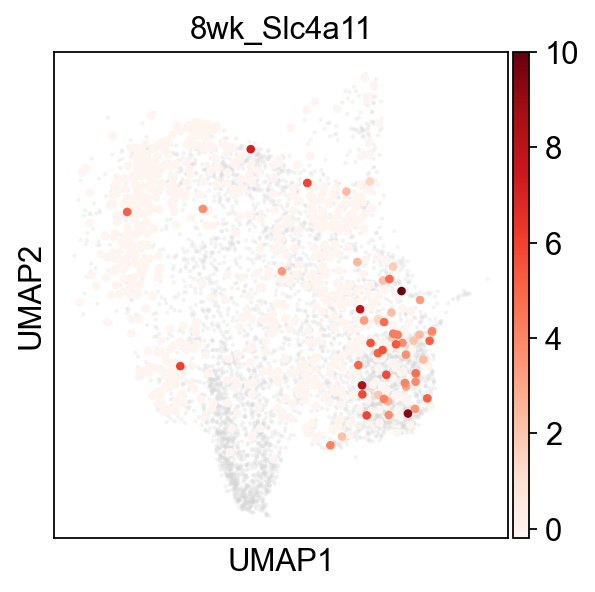

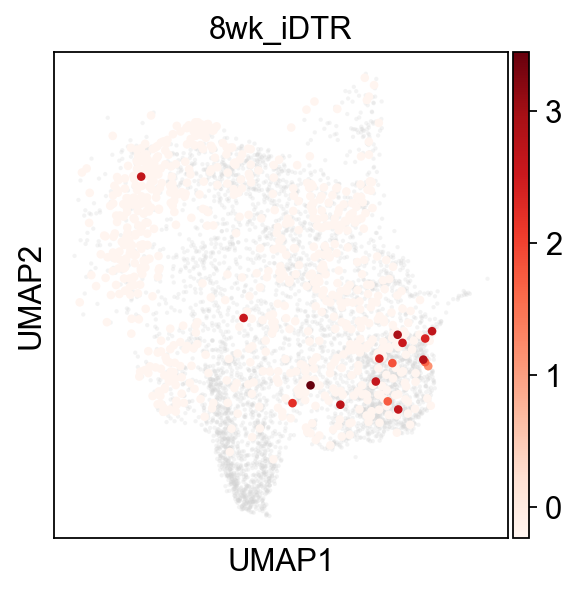

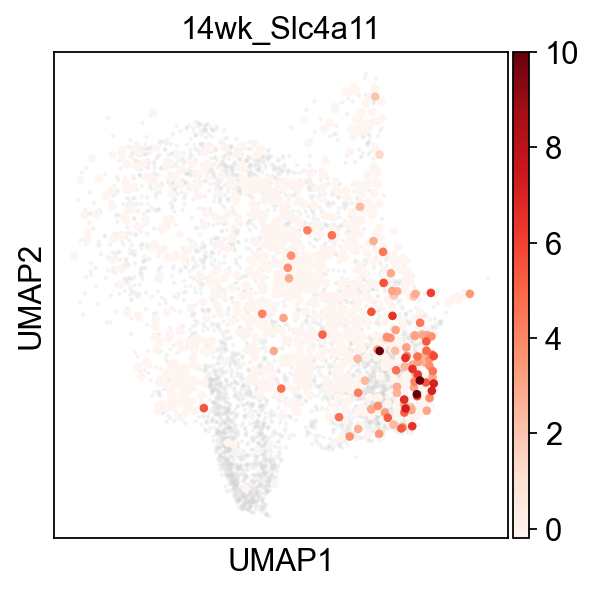

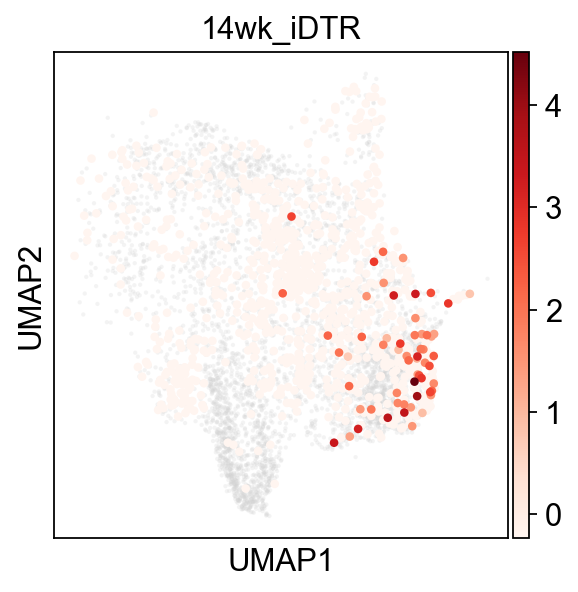

In [139]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

group_col = 'Group'
type_col  = 'cell type'
groups    = ['8wk', '14wk']  # order you want

# Ensure cell type is categorical with a stable, global order
adata.obs[type_col] = adata.obs[type_col].astype('category')
type_cats = list(adata.obs[type_col].cat.categories)

# Use the exact palette already stored in .uns
# (Scanpy maps colors to categories by order.)
palette = adata.uns[f'{type_col}_colors']

# sanity check: palette length should match number of categories
if len(palette) != len(type_cats):
    raise ValueError(f"Palette length ({len(palette)}) != categories ({len(type_cats)})")
palette = list(adata.uns[f'{type_col}_colors'])
# styling
bg_size, bg_alpha = 15, 0.25        # background points
fg_size = 60                       # foreground points

for grp in groups:
    # First: draw a standard UMAP *background* to get Scanpy's default figure/axes sizing


    # Foreground: this group's cells, colored by cell type, using the same palette as adata.uns
    #adata_grp = adata[adata.obs[group_col].isin(grp), :].copy()
    # Make sure the subset keeps the same category order so colors line up
    genes = ['Slc4a11','iDTR']
    for x in genes:
        adata_grp = adata[adata.obs[group_col].isin([grp]), :].copy()
        fig = sc.pl.umap(
            adata,
            color=None,                # no color, just points
            size=bg_size,
            alpha=bg_alpha,
            frameon=True,              # keep axes/frame like default
            show=False,
            return_fig=True            # <- get the same-sized Axes Scanpy uses
        )
        ax = fig.axes[0]
        
        sc.pl.umap(
            adata_grp,
            color=x,
            cmap='Reds',           # exact same color scheme
            use_raw=False,             # avoid .raw overriding values
            size=fg_size,
            na_color='darkgray',
            frameon=True,
            ax=ax,                     # overlay on the SAME axes
            show=False,
        )
    
        ax.set_title(f'{grp}_{x}')              # title per panel, like standard
        plt.savefig(f'figures/Ext_Data_Fig8cd_uMAP_{grp}_{x}.svg')
        plt.show()


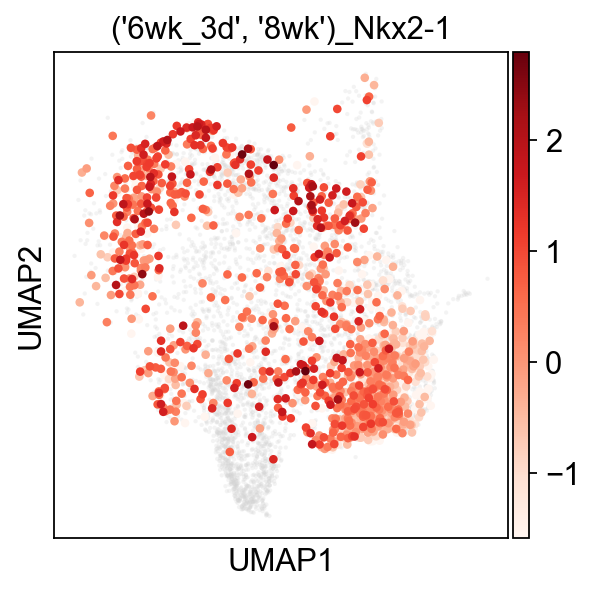

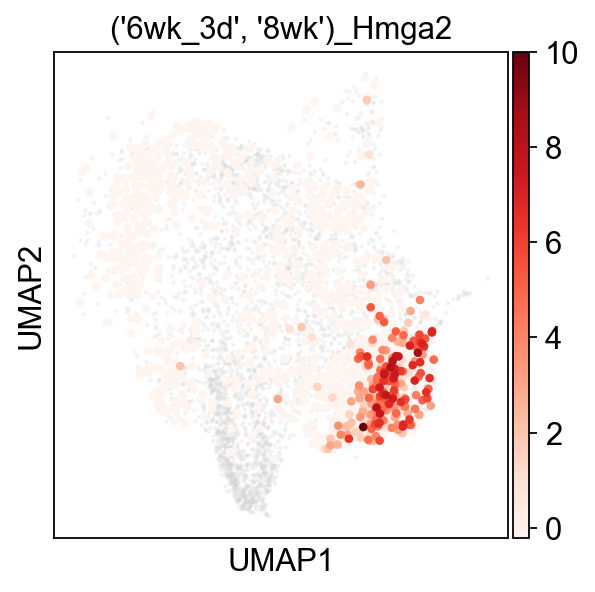

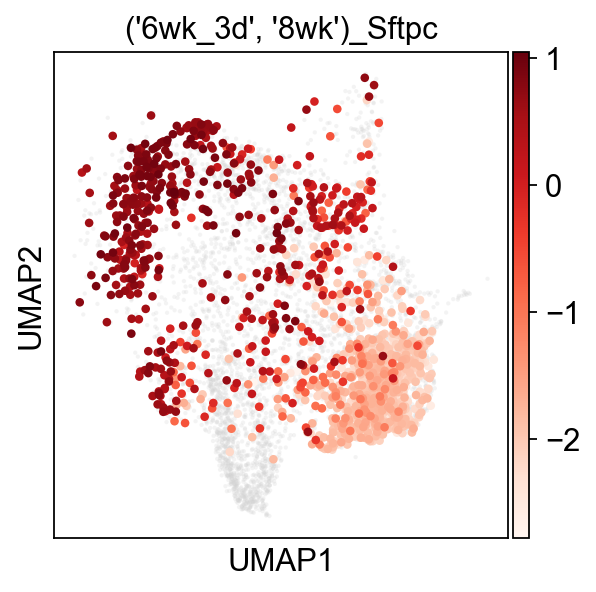

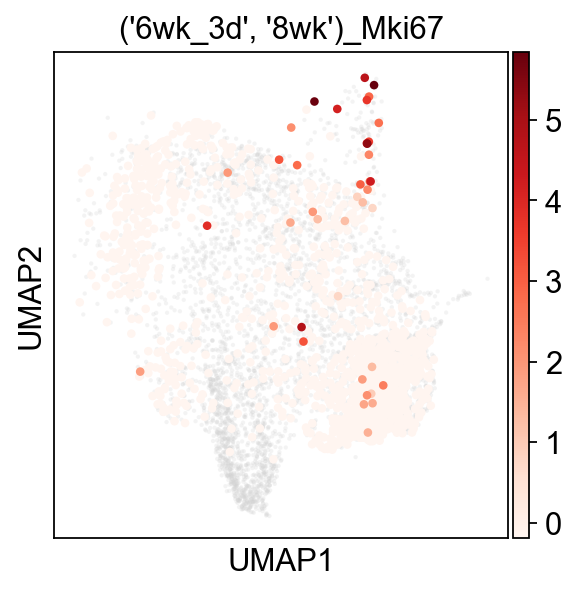

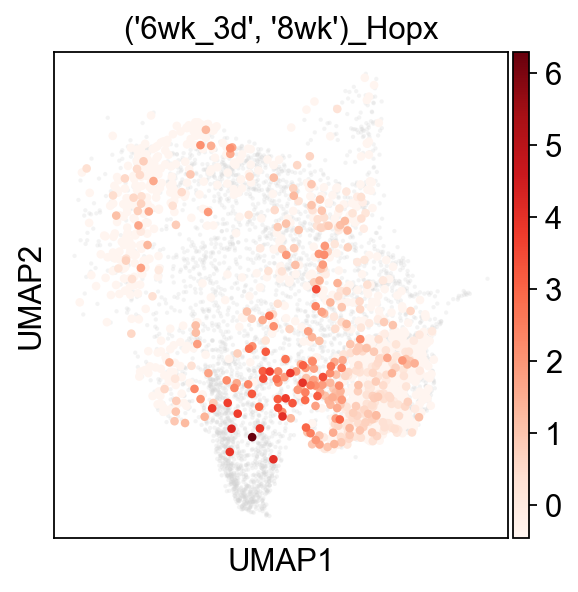

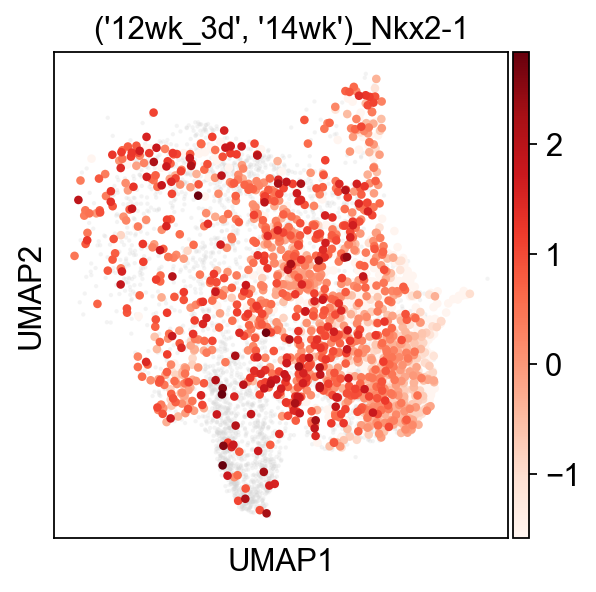

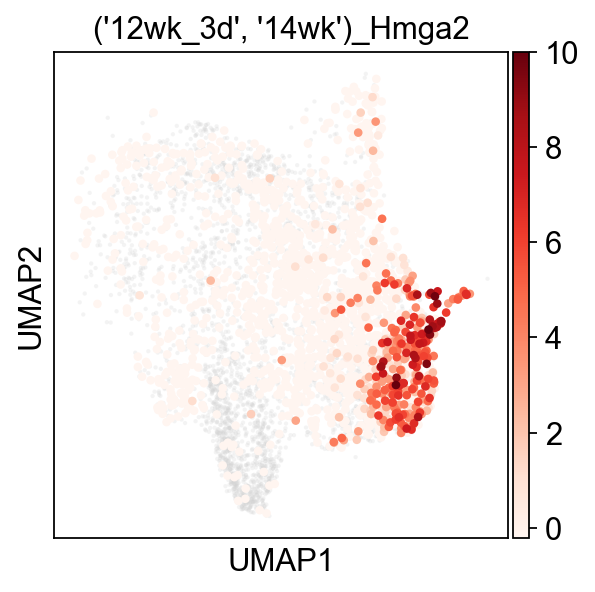

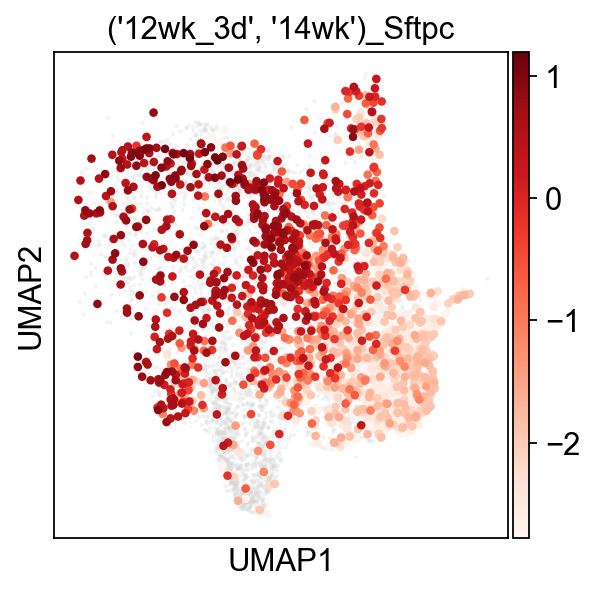

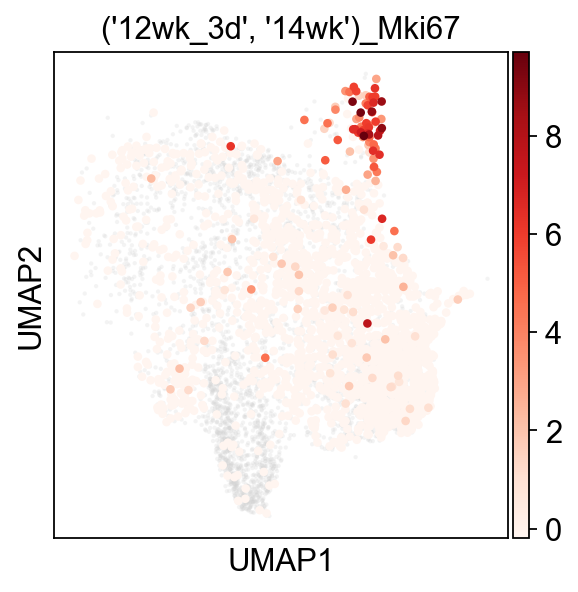

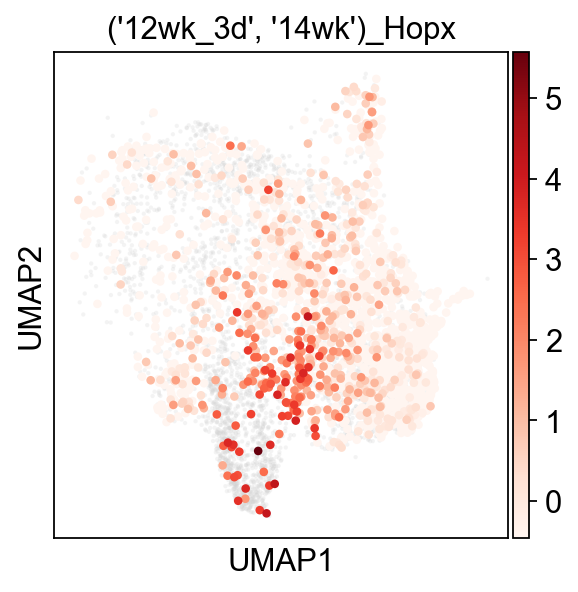

In [134]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

group_col = 'Group'
type_col  = 'cell type'
groups    = [('6wk_3d','8wk'), ('12wk_3d','14wk')]  # order you want

# Ensure cell type is categorical with a stable, global order
adata.obs[type_col] = adata.obs[type_col].astype('category')
type_cats = list(adata.obs[type_col].cat.categories)

# Use the exact palette already stored in .uns
# (Scanpy maps colors to categories by order.)
palette = adata.uns[f'{type_col}_colors']

# sanity check: palette length should match number of categories
if len(palette) != len(type_cats):
    raise ValueError(f"Palette length ({len(palette)}) != categories ({len(type_cats)})")
palette = list(adata.uns[f'{type_col}_colors'])
# styling
bg_size, bg_alpha = 15, 0.25        # background points
fg_size = 60                       # foreground points

for grp in groups:
    # First: draw a standard UMAP *background* to get Scanpy's default figure/axes sizing


    # Foreground: this group's cells, colored by cell type, using the same palette as adata.uns
    #adata_grp = adata[adata.obs[group_col].isin(grp), :].copy()
    # Make sure the subset keeps the same category order so colors line up
    genes = ['Nkx2-1','Hmga2','Sftpc','Mki67','Hopx']
    for x in genes:
        adata_grp = adata[adata.obs[group_col].isin(grp), :].copy()
        fig = sc.pl.umap(
            adata,
            color=None,                # no color, just points
            size=bg_size,
            alpha=bg_alpha,
            frameon=True,              # keep axes/frame like default
            show=False,
            return_fig=True            # <- get the same-sized Axes Scanpy uses
        )
        ax = fig.axes[0]
        
        sc.pl.umap(
            adata_grp,
            color=x,
            cmap='Reds',           # exact same color scheme
            use_raw=False,             # avoid .raw overriding values
            size=fg_size,
            na_color='darkgray',
            frameon=True,
            ax=ax,                     # overlay on the SAME axes
            show=False,
        )
    
        ax.set_title(f'{grp}_{x}')              # title per panel, like standard
        plt.savefig(f'figures/Ext_Data_Fig8e_uMAP_{grp}_{x}.svg')
        plt.show()


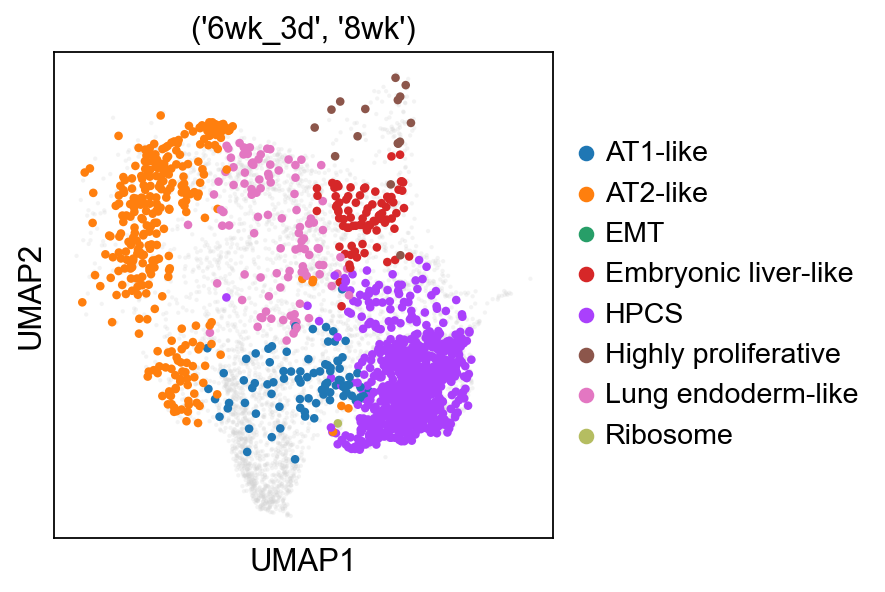

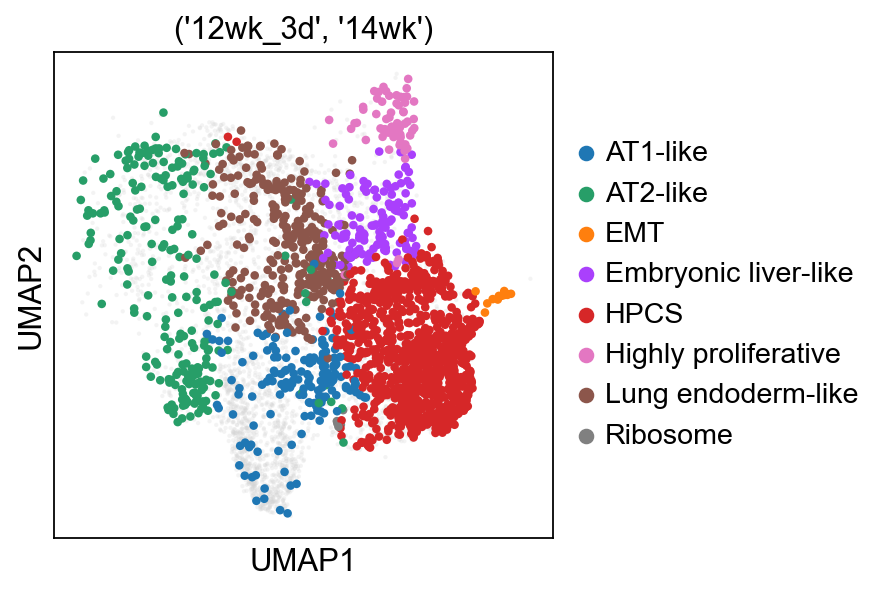

In [135]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

group_col = 'Group'
type_col  = 'cell type'
groups    = [('6wk_3d','8wk'), ('12wk_3d','14wk')]  # order you want

# Ensure cell type is categorical with a stable, global order
adata.obs[type_col] = adata.obs[type_col].astype('category')
type_cats = list(adata.obs[type_col].cat.categories)

# Use the exact palette already stored in .uns
# (Scanpy maps colors to categories by order.)
palette = adata.uns[f'{type_col}_colors']

# sanity check: palette length should match number of categories
if len(palette) != len(type_cats):
    raise ValueError(f"Palette length ({len(palette)}) != categories ({len(type_cats)})")
palette = list(adata.uns[f'{type_col}_colors'])
# styling
bg_size, bg_alpha = 15, 0.25        # background points
fg_size = 60                       # foreground points

for grp in groups:
    # First: draw a standard UMAP *background* to get Scanpy's default figure/axes sizing
    fig = sc.pl.umap(
        adata,
        color=None,                # no color, just points
        size=bg_size,
        alpha=bg_alpha,
        frameon=True,              # keep axes/frame like default
        show=False,
        return_fig=True            # <- get the same-sized Axes Scanpy uses
    )
    ax = fig.axes[0]

    # Foreground: this group's cells, colored by cell type, using the same palette as adata.uns
    adata_grp = adata[adata.obs[group_col].isin(grp), :].copy()
    # Make sure the subset keeps the same category order so colors line up
    adata_grp.obs[type_col] = adata_grp.obs[type_col].cat.set_categories(type_cats)

    sc.pl.umap(
        adata_grp,
        color=type_col,
        #palette=palette,           # exact same color scheme
        use_raw=False,             # avoid .raw overriding values
        size=fg_size,
        na_color='darkgray',
        frameon=True,
        ax=ax,                     # overlay on the SAME axes
        show=False,
    )

    ax.set_title(grp)              # title per panel, like standard
    plt.savefig(f'figures/Fig2e_uMAP_{grp}_cellstates.svg')
    plt.show()


## For Revision

In [54]:
adata = adataold.copy()

In [55]:
# Response to Reviewer 1 Point 1: How frequent is the HPCS
# Count within 6w3d

counts = adata[adata.obs.Classification.isin(['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 
                                          'BS1265_B0305','BR1128_B0307']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()
print(counts[counts['cell type'] == 'HPCS'])
print(f'HPCS mean: {counts[counts["cell type"] == "HPCS"]["proportion"].mean()} +/- {counts[counts["cell type"] == "HPCS"]["proportion"].std()}')
print(f'not HPCS mean: {(1-counts[counts["cell type"] == "HPCS"]["proportion"]).mean()} +/- {(1-counts[counts["cell type"] == "HPCS"]["proportion"]).std()}')

   Classification cell type  proportion
0    BO1535_B0302      HPCS    0.946667
5    BO1540_B0303      HPCS    0.964789
10   BR1128_B0307      HPCS    0.964286
15   BR1615_B0304      HPCS    0.942308
20   BS1265_B0305      HPCS    0.948276
HPCS mean: 0.9532649335446809 +/- 0.010520749065285256
not HPCS mean: 0.046735066455318997 +/- 0.010520749065285256


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_51519/1573742569.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'BS1265_B0305','BR1128_B0307']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()


In [56]:
# Response to Reviewer 1 Point 1: How frequent is the HPCS
# Count within 12w3d

counts = adata[adata.obs.Classification.isin(['BL1121_B0304','BL1124_B0305','BL1233_B0306',
                                              'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()
print(counts[counts['cell type'] == 'HPCS'])
print(f'HPCS mean: {counts[counts["cell type"] == "HPCS"]["proportion"].mean()} +/- {counts[counts["cell type"] == "HPCS"]["proportion"].std()}')
print(f'not HPCS mean: {(1-counts[counts["cell type"] == "HPCS"]["proportion"]).mean()} +/- {(1-counts[counts["cell type"] == "HPCS"]["proportion"]).std()}')

   Classification cell type  proportion
0    BL1121_B0304      HPCS    0.789474
8    BL1124_B0305      HPCS    0.776119
16   BL1233_B0306      HPCS    0.482759
24   BL1237_B0302      HPCS    0.794979
32   BL1606_B0303      HPCS    0.584746
40   BL1646_B0301      HPCS    0.774510
HPCS mean: 0.7004310590027661 +/- 0.13330317425032118
not HPCS mean: 0.2995689409972338 +/- 0.13330317425032118


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_51519/3666075799.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()


In [57]:
# Response to Reviewer 1 Point 1: How frequent is the HPCS
# Combine 6w3d and 12w3d since they are similar enough

counts = adata[adata.obs.Classification.isin(['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 
                                          'BS1265_B0305','BR1128_B0307','BL1121_B0304','BL1124_B0305','BL1233_B0306',
                                              'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()
print(f'HPCS mean: {counts[counts["cell type"] != "HPCS"]["proportion"].mean()} +/- {counts[counts["cell type"] != "HPCS"]["proportion"].std()}')

HPCS mean: 0.02637777893844153 +/- 0.03823918885869575


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_51519/3691320032.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()


In [58]:
counts[counts["cell type"] != "HPCS"]["proportion"]

1     0.070175
2     0.070175
3     0.052632
4     0.017544
5     0.000000
        ...   
83    0.000000
84    0.000000
85    0.000000
86    0.000000
87    0.000000
Name: proportion, Length: 77, dtype: float64

In [59]:
# Response to Reviewer 1 Point 1: How frequent is the HPCS
# Combine count within 6w3d and 12w3d since they are similar enough

counts = adata[adata.obs.Classification.isin(['BO1535_B0302', 'BO1540_B0303', 'BR1615_B0304', 
                                          'BS1265_B0305','BR1128_B0307','BL1121_B0304','BL1124_B0305','BL1233_B0306',
                                              'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()
print(f'HPCS mean: {counts[counts["cell type"] == "HPCS"]["proportion"].mean()} +/- {counts[counts["cell type"] == "HPCS"]["proportion"].std()}')

HPCS mean: 0.8153555474309093 +/- 0.16236756083154216


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_51519/2377923743.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'BL1237_B0302','BL1606_B0303','BL1646_B0301']),:].obs.groupby('Classification')['cell type'].value_counts(normalize=True).reset_index()


### investigate Mki67

In [63]:
adata.obs['Mki67_obs'] = [1 if x else 0 for x in adata[:,'Mki67'].X != adata[:,'Mki67'].X.min()]

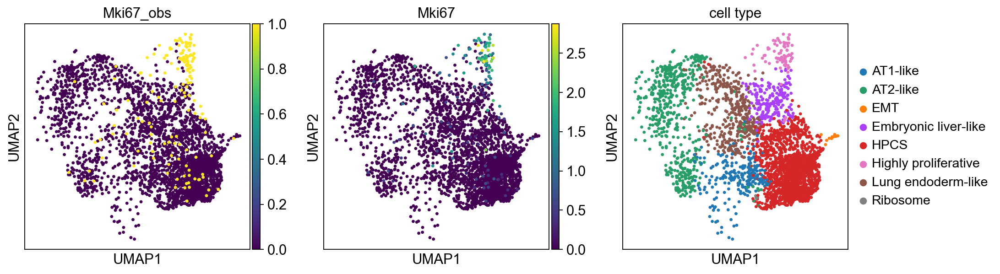

In [64]:
sc.pl.umap(adata, color=['Mki67_obs', 'Mki67','cell type'])

In [72]:
print(pd.crosstab(adata[adata.obs.Group == '8wk',:].obs['cell type'],adata[adata.obs.Group == '8wk',:].obs['Mki67_obs']))
print(pd.crosstab(adata[adata.obs.Group == '8wk',:].obs['cell type'],adata[adata.obs.Group == '8wk',:].obs['Mki67_obs'], normalize='columns'))

Mki67_obs               0   1
cell type                    
AT1-like               67   1
AT2-like              296   1
Embryonic liver-like   72  10
HPCS                  181   1
Highly proliferative    2  10
Lung endoderm-like     95   5
Ribosome                1   0
Mki67_obs                    0         1
cell type                               
AT1-like              0.093838  0.035714
AT2-like              0.414566  0.035714
Embryonic liver-like  0.100840  0.357143
HPCS                  0.253501  0.035714
Highly proliferative  0.002801  0.357143
Lung endoderm-like    0.133053  0.178571
Ribosome              0.001401  0.000000


In [73]:
print(pd.crosstab(adata[adata.obs.Group == '14wk',:].obs['cell type'],adata[adata.obs.Group == '14wk',:].obs['Mki67_obs']))
print(pd.crosstab(adata[adata.obs.Group == '14wk',:].obs['cell type'],adata[adata.obs.Group == '14wk',:].obs['Mki67_obs'], normalize='columns'))

Mki67_obs               0   1
cell type                    
AT1-like               95   1
AT2-like              154   5
EMT                     8   1
Embryonic liver-like   83  10
HPCS                  322  12
Highly proliferative    4  32
Lung endoderm-like    257   7
Mki67_obs                    0         1
cell type                               
AT1-like              0.102925  0.014706
AT2-like              0.166847  0.073529
EMT                   0.008667  0.014706
Embryonic liver-like  0.089924  0.147059
HPCS                  0.348862  0.176471
Highly proliferative  0.004334  0.470588
Lung endoderm-like    0.278440  0.102941
